In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import duckdb
from concurrent.futures import ThreadPoolExecutor, as_completed
import dask.dataframe as dd
import sys
import glob
import os
from Bio.Seq import Seq

sys.path.append("/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/")
from scripts import initial_map, map_refiner, complexity, finder, preprocess, error_correct, plotting, umi_deduplicate


from tqdm import tqdm  # progress bar

# 1. AD 

## A. Getting expected barcode counts

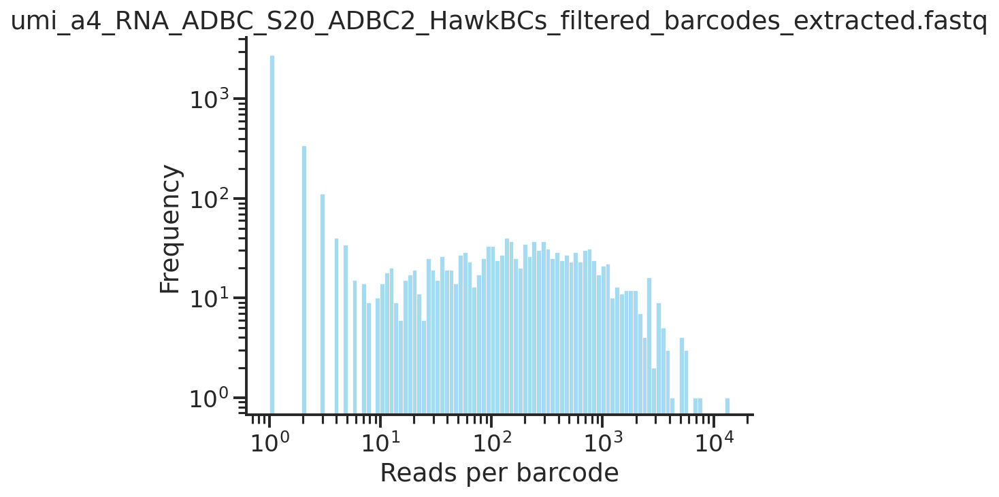

Enter chosen threshold for umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


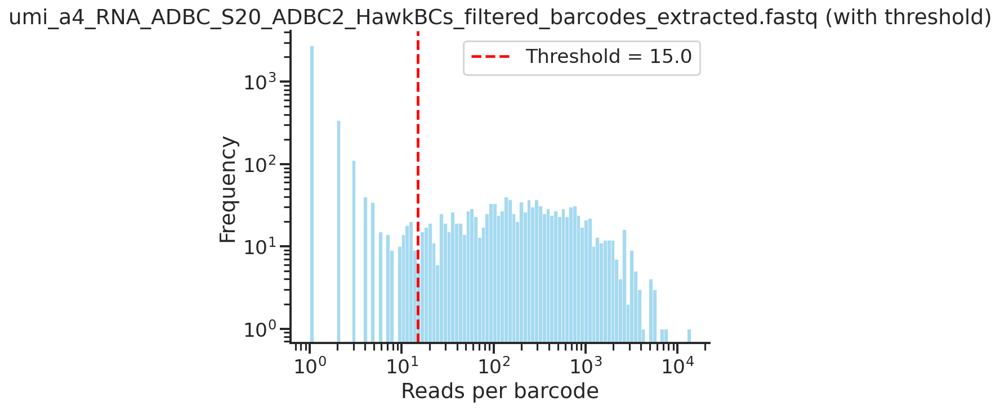

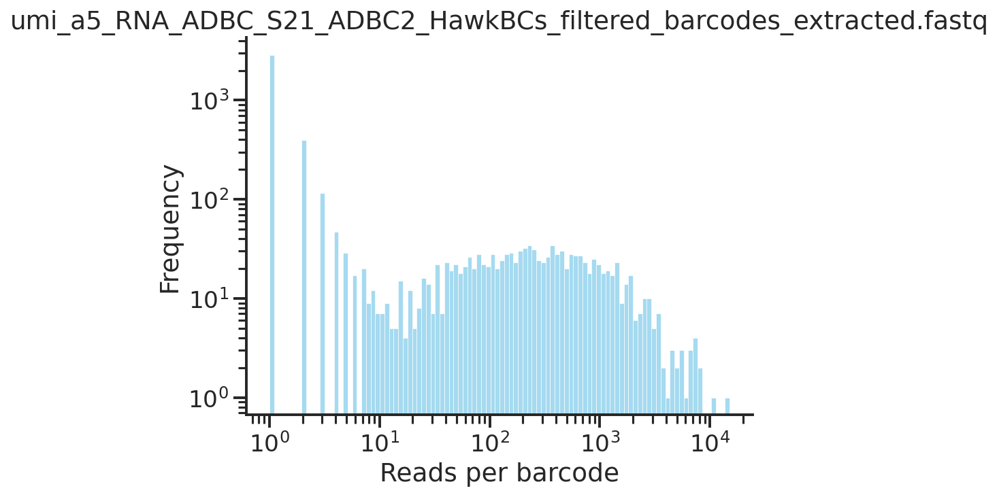

Enter chosen threshold for umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


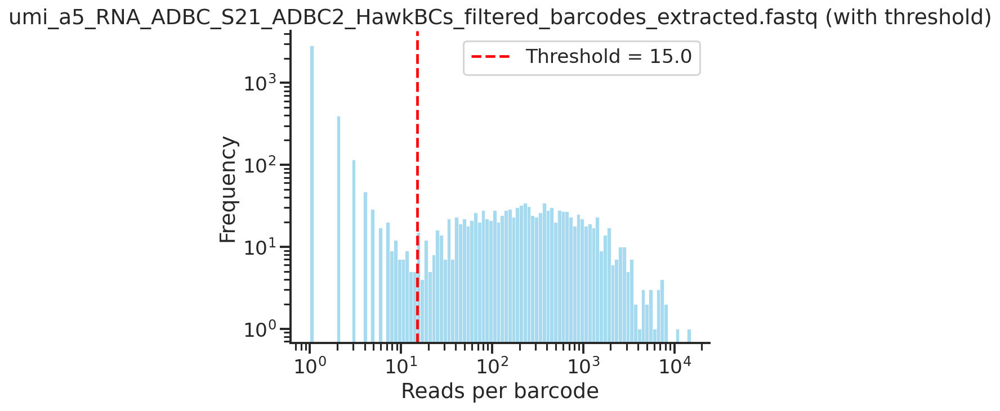

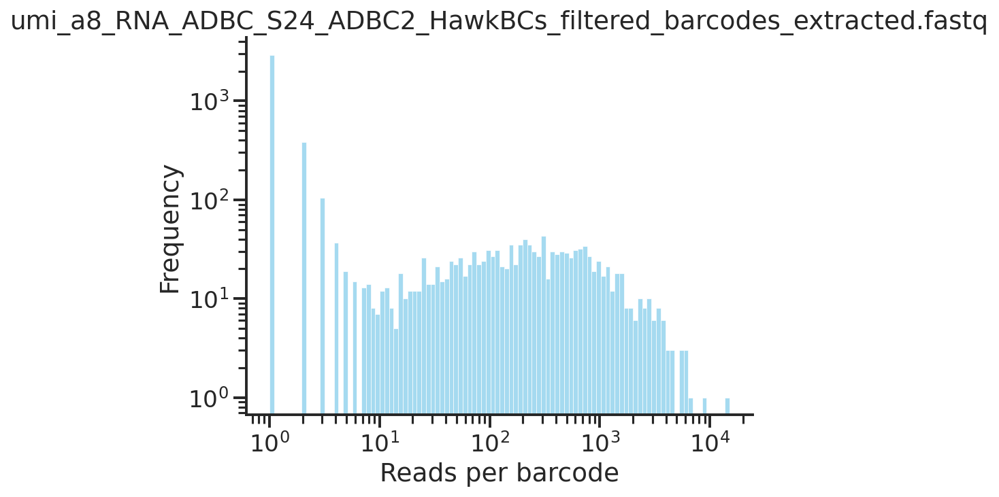

Enter chosen threshold for umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


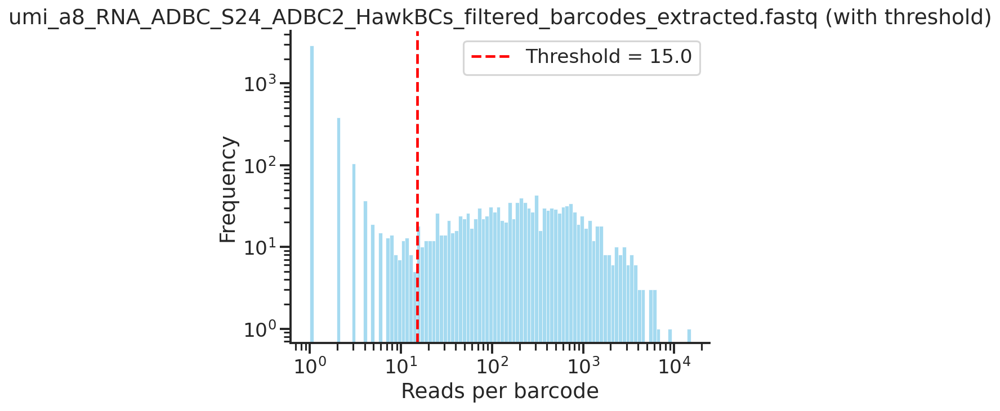

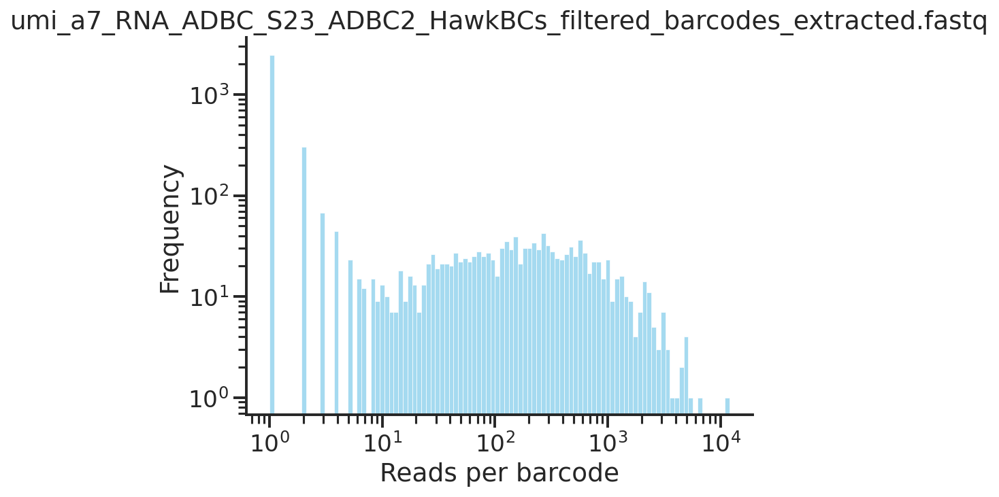

Enter chosen threshold for umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


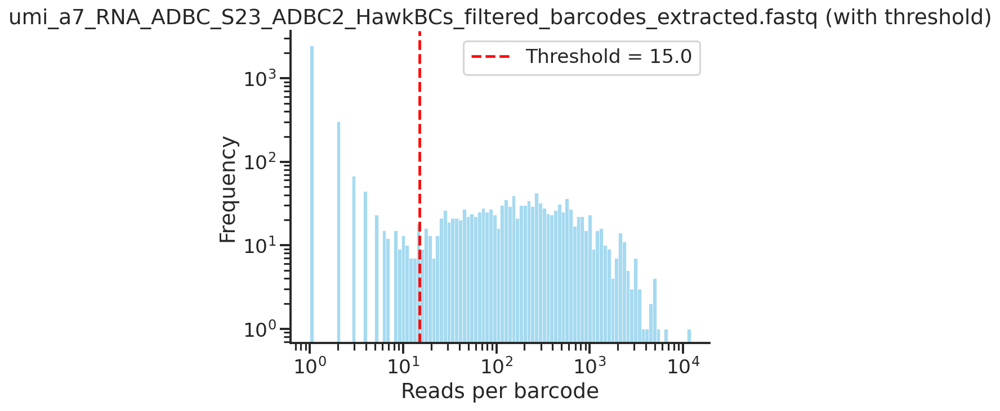

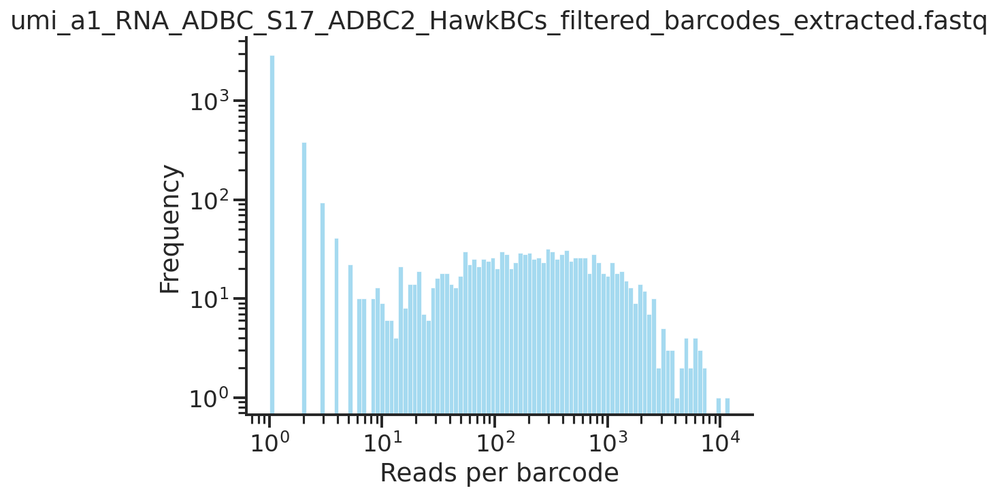

Enter chosen threshold for umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


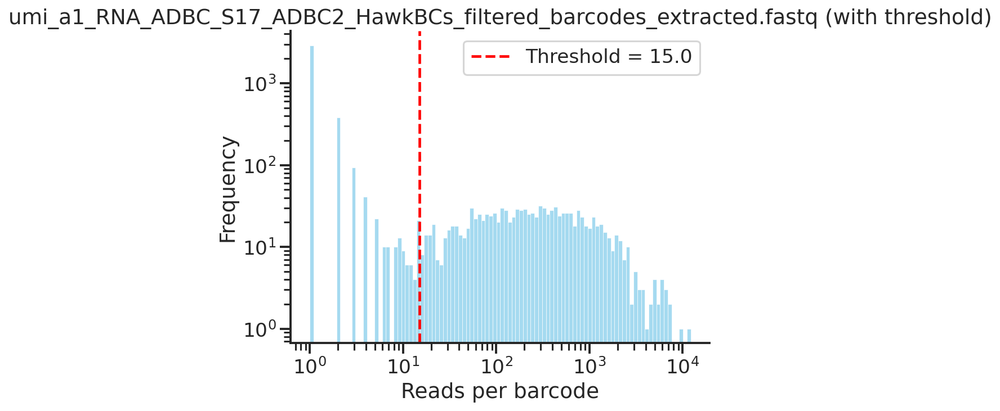

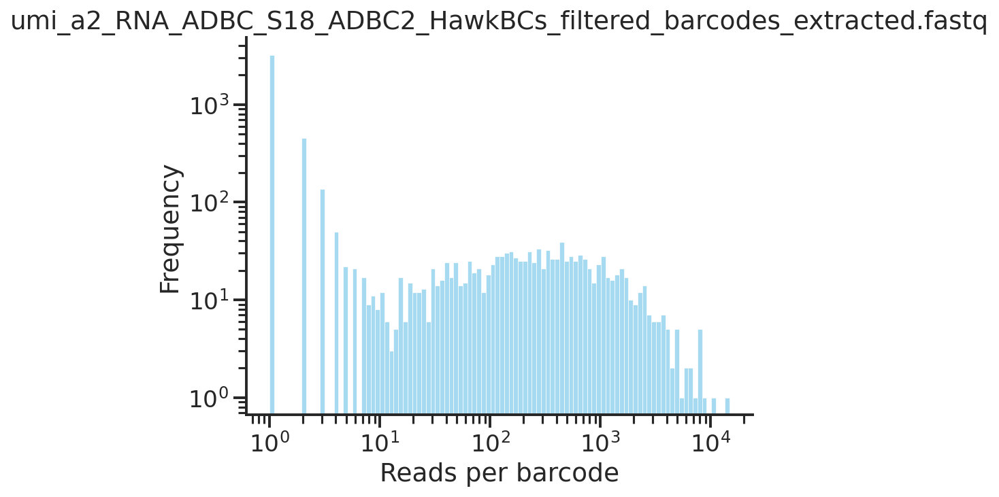

Enter chosen threshold for umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


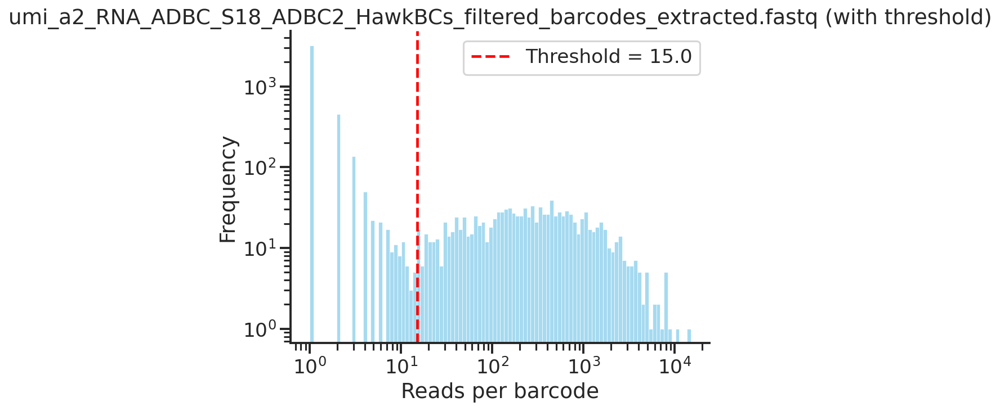

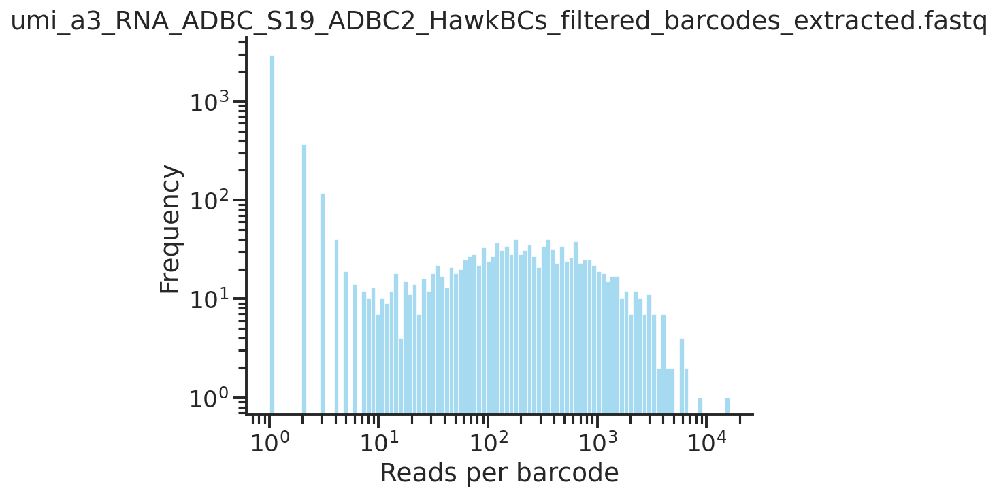

Enter chosen threshold for umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


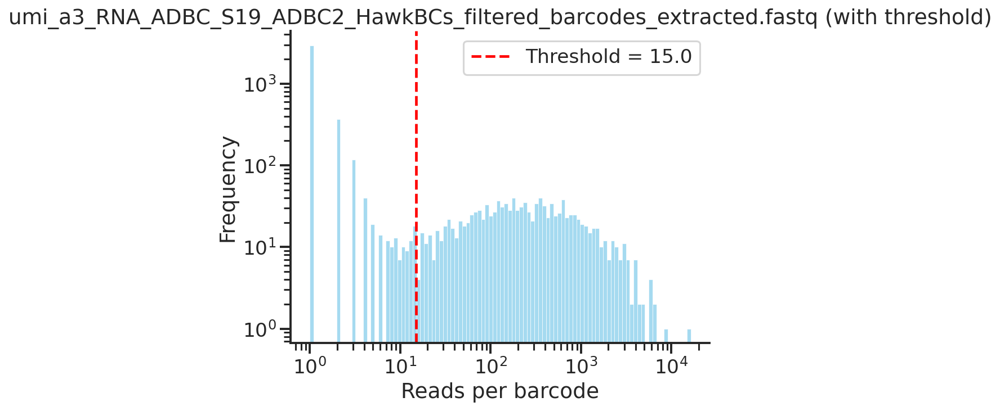

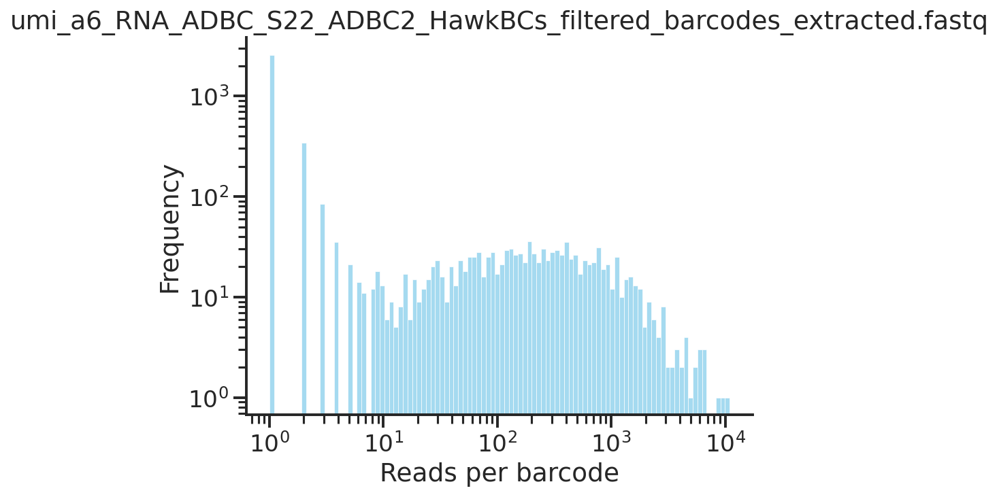

Enter chosen threshold for umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq:  15


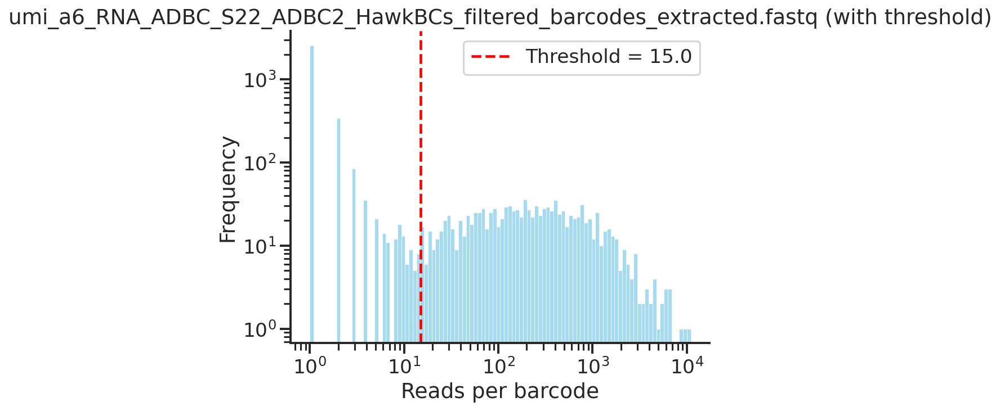

In [43]:
sns.set_style('ticks')

AD_seq_files = glob.glob(
    "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/*ADBC*/*.fastq"
)

custom_bc_counts = {}

for file_path in AD_seq_files:
    # Load extracted barcodes
    extracted_barcodes = pd.read_csv(file_path, header=None)
    extracted_barcodes = extracted_barcodes.reset_index()
    extracted_barcodes = extracted_barcodes[(extracted_barcodes["index"] % 4) == 1]
    extracted_barcodes = extracted_barcodes.drop(columns="index")

    # Compute counts per barcode
    counts = extracted_barcodes[0].value_counts()

    # Plot histogram
    plt.figure(dpi=150)
    ax = sns.histplot(counts, log_scale=(True, True), bins=100, color='skyblue')
    sns.despine()
    ax.set_title(file_path.split("/")[-1])
    plt.xlabel("Reads per barcode")
    plt.ylabel("Frequency")
    plt.show()

    # Prompt user to input threshold
    thresh = float(input(f"Enter chosen threshold for {file_path.split('/')[-1]}: "))
    #custom_reads_thresholds[file_path] = thresh

    # Show histogram again with threshold as vertical line
    plt.figure(dpi=150)
    ax = sns.histplot(counts, log_scale=(True, True), bins=100, color='skyblue')
    sns.despine()
    plt.axvline(thresh, color='red', linestyle='--', label=f'Threshold = {thresh}')
    ax.set_title(f"{file_path.split('/')[-1]} (with threshold)")
    plt.xlabel("Reads per barcode")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

    density_bc_count = sum(counts> thresh)
    custom_bc_counts[file_path.split("/")[-2][4:]] = density_bc_count

**Seems like 15 reads is a good threshold for all samples.**

In [44]:
# Number of barcodes to keep for each
custom_bc_counts

{'a4_RNA_ADBC_S20': 1226,
 'a5_RNA_ADBC_S21': 1142,
 'a8_RNA_ADBC_S24': 1237,
 'a7_RNA_ADBC_S23': 1219,
 'a1_RNA_ADBC_S17': 1156,
 'a2_RNA_ADBC_S18': 1170,
 'a3_RNA_ADBC_S19': 1235,
 'a6_RNA_ADBC_S22': 1144}

## B. Running error correction

In [20]:
# UPDATE list of files and output location
AD_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a*")
RT_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/r*")
output_path = "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold" # May need to change to your directory due to writing permissions

# Change below as needed to update barcode info, csv path to final step1 map, and desired output directory


step1_ADBC2 = finder.Barcode(name = "ADBC2",
                       preceder = "TATGCTAT",
                       post = "GGCCGGCCG",
                       length = 6)

step1_HawkBCs = finder.Barcode(name = "HawkBCs",
                       preceder = "TAGC",
                       post = "CTCGAGA",
                       length = 9)

step1_RTBC = finder.Barcode(name = "RTBC",
                       preceder = "GCCCC",
                       post = "GCGG",
                       length = 16)

# Step 1 map
step1_csv = "../../output/NKX2-2_whitelist_concat_density_step1_map.csv"  # Step 1 map I made with error correcting 

In [4]:
db_path = os.path.join(output_path, "NKX2-2_CC_UMI_whitelisted_concat_custom_threshold.db")

In [47]:
AD_objects = [step1_ADBC2, step1_HawkBCs]

In [11]:
complex_AD_results = []
simple_AD_results = []

In [49]:
AD_seq_files

['/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a2_RNA_ADBC_S18.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a7_RNA_ADBC_S23.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a1_RNA_ADBC_S17.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a3_RNA_ADBC_S19.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a6_RNA_ADBC_S22.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a4_RNA_ADBC_S20.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a8_RNA_ADBC_S24.fastq.gz.assembled.fastq',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a5_RNA_ADBC_S21.fastq.gz.assembled.fastq']

a2_RNA_ADBC_S18
/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18
Reading 1 FASTQ/TXT file(s)...
Done in 1.97 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.74 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.49 seconds.

Extracting UMIs (12 bases)...
Done in 0.62 seconds.

Done in 1.73 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
Full prefix for this instance: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.64 seconds.


=== Running error correction step on umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a2_RNA_ADBC_S18 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 769918 reads to /global/scratch/projects/fc_m

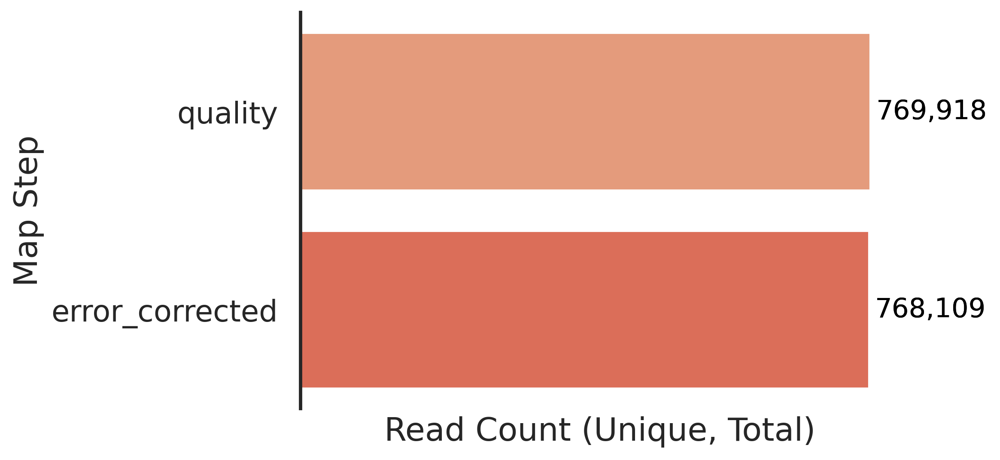

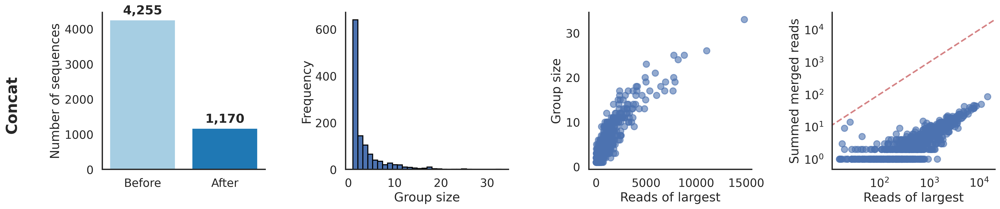

Done in 2.90 seconds.

1170
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq (768109 reads)...


Writing FASTQ: 100%|██████████| 768109/768109 [00:00<00:00, 2166259.41it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq
Done in 0.82 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 2.78 seconds.

Aligning .FASTQ to reference .FA ...


768109 reads; of these:
  768109 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    768109 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_deduplicated.bam
# job started at Thu Dec 11 13:25:43 2025 on n0001.savio2 -- 898f2884-54ac-4ff2-9b7e-de96faba8310
# pid: 4037491, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.60 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 2.71 seconds.

Extracting UMIs (12 bases)...
Done in 0.49 seconds.

Done in 1.23 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_
Full prefix for this instance: umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.49 seconds.


=== Running error correction step on umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a7_RNA_ADBC_S23 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 549074 reads to /global/scratch/projects/fc_m

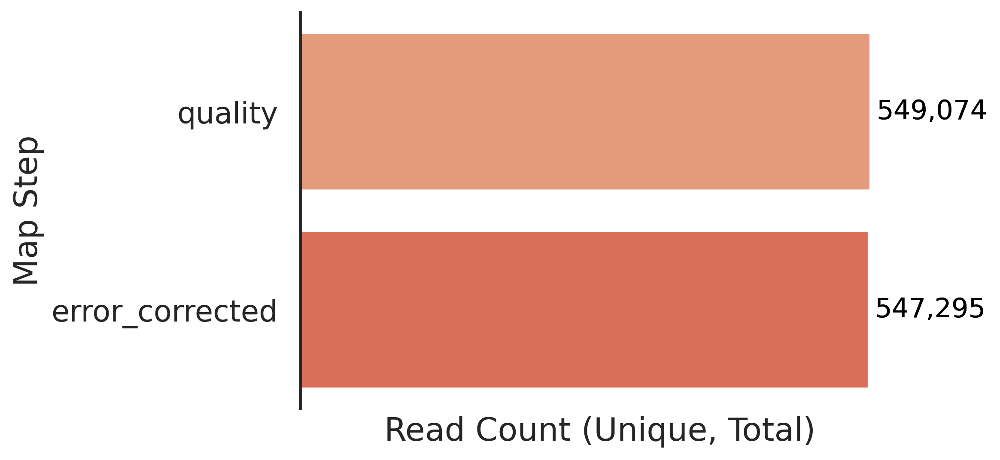

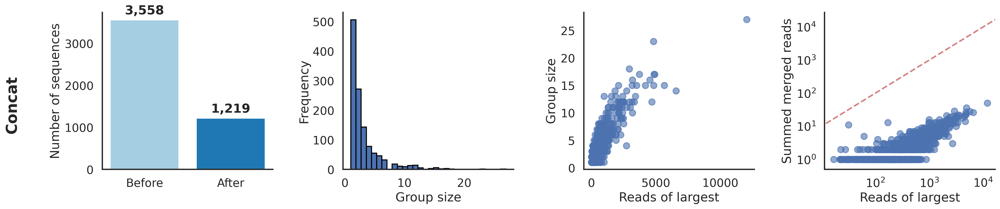

Done in 2.50 seconds.

1219
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq (547295 reads)...


Writing FASTQ: 100%|██████████| 547295/547295 [00:00<00:00, 2101023.55it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq
Done in 0.56 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.62 seconds.

Aligning .FASTQ to reference .FA ...


547295 reads; of these:
  547295 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    547295 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_deduplicated.bam
# job started at Thu Dec 11 13:27:00 2025 on n0001.savio2 -- 2f8f4e7d-42c9-44ae-b236-d0bc231e9b6e
# pid: 4037635, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.69 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.08 seconds.

Extracting UMIs (12 bases)...
Done in 0.57 seconds.

Done in 1.50 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_
Full prefix for this instance: umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.64 seconds.


=== Running error correction step on umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a1_RNA_ADBC_S17 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 661295 reads to /global/scratch/projects/fc_m

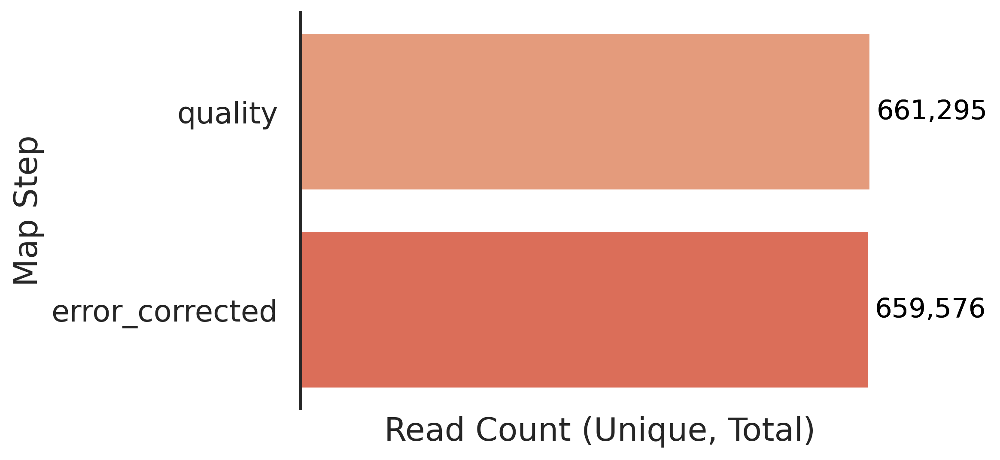

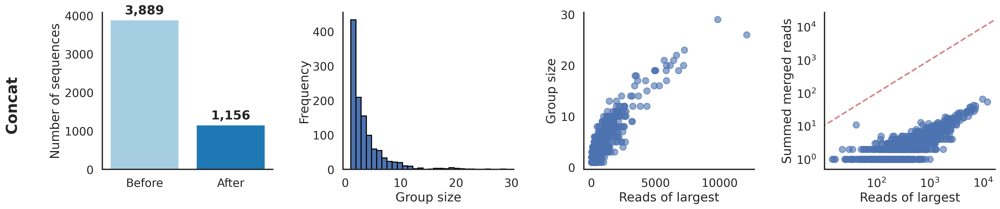

Done in 2.69 seconds.

1156
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.fastq (659576 reads)...


Writing FASTQ: 100%|██████████| 659576/659576 [00:00<00:00, 2156165.95it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.fastq
Done in 0.69 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.22 seconds.

Aligning .FASTQ to reference .FA ...


659576 reads; of these:
  659576 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    659576 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_deduplicated.bam
# job started at Thu Dec 11 13:27:57 2025 on n0001.savio2 -- 64c0fd13-cc8c-4ee2-8a0c-30fbc27061bf
# pid: 4037787, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.96 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.19 seconds.

Extracting UMIs (12 bases)...
Done in 0.59 seconds.

Done in 1.59 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_
Full prefix for this instance: umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.58 seconds.


=== Running error correction step on umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a3_RNA_ADBC_S19 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 679747 reads to /global/scratch/projects/fc_m

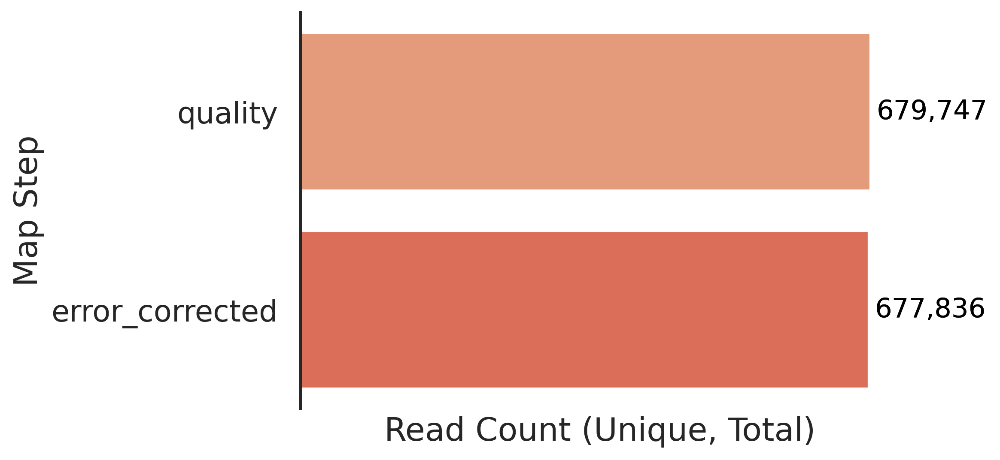

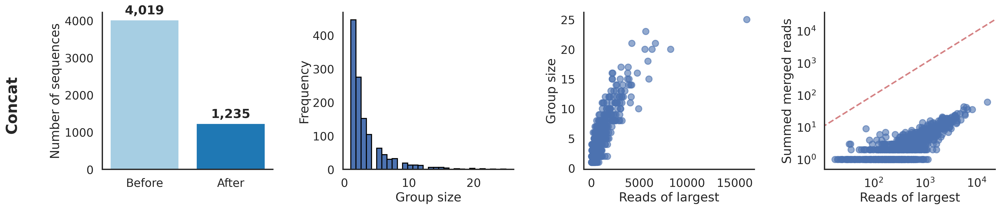

Done in 2.49 seconds.

1235
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.fastq (677836 reads)...


Writing FASTQ: 100%|██████████| 677836/677836 [00:00<00:00, 2121734.71it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.fastq
Done in 0.67 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.60 seconds.

Aligning .FASTQ to reference .FA ...


677836 reads; of these:
  677836 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    677836 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_deduplicated.bam
# job started at Thu Dec 11 13:29:07 2025 on n0001.savio2 -- 2f1227fe-2e5d-4589-853a-874db77bd6c6
# pid: 4037938, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.34 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.09 seconds.

Extracting UMIs (12 bases)...
Done in 0.51 seconds.

Done in 1.36 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_
Full prefix for this instance: umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.53 seconds.


=== Running error correction step on umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a6_RNA_ADBC_S22 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 603853 reads to /global/scratch/projects/fc_m

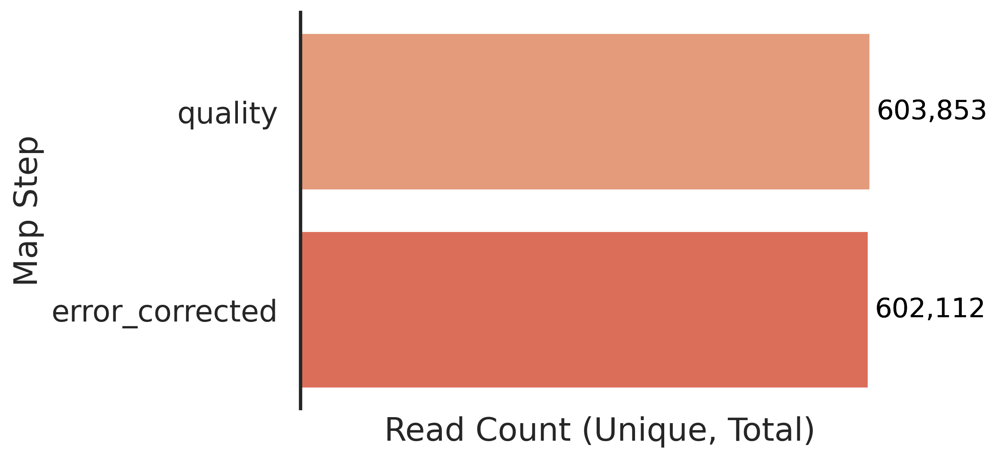

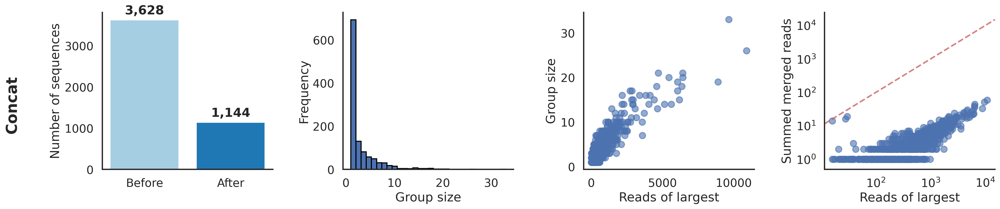

Done in 2.47 seconds.

1144
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.fastq (602112 reads)...


Writing FASTQ: 100%|██████████| 602112/602112 [00:00<00:00, 2155920.34it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.fastq
Done in 0.63 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.63 seconds.

Aligning .FASTQ to reference .FA ...


602112 reads; of these:
  602112 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    602112 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_deduplicated.bam
# job started at Thu Dec 11 13:30:12 2025 on n0001.savio2 -- bc106cba-ca65-45f4-8a4f-71b87880e3eb
# pid: 4038095, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.35 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 2.99 seconds.

Extracting UMIs (12 bases)...
Done in 0.54 seconds.

Done in 1.37 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_
Full prefix for this instance: umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.54 seconds.


=== Running error correction step on umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a4_RNA_ADBC_S20 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 623478 reads to /global/scratch/projects/fc_m

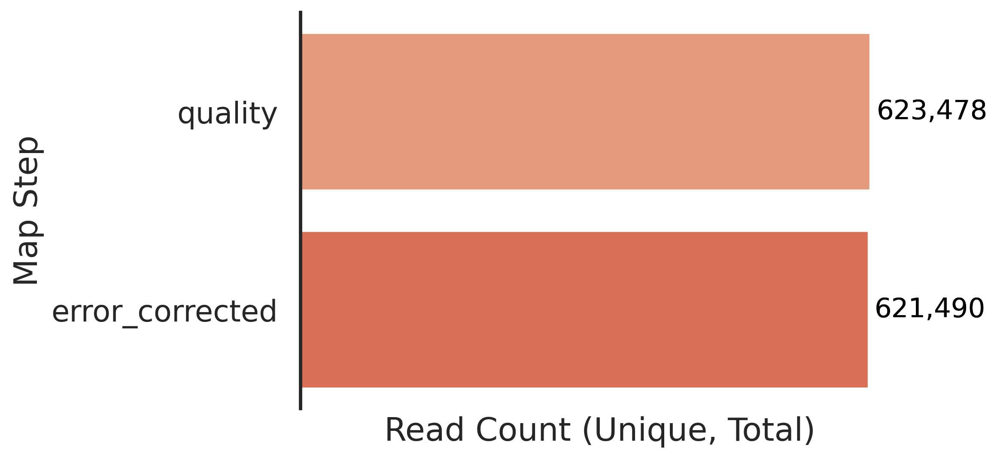

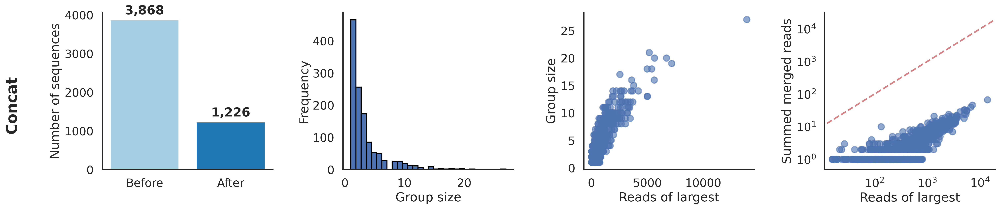

Done in 2.47 seconds.

1226
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.fastq (621490 reads)...


Writing FASTQ: 100%|██████████| 621490/621490 [00:00<00:00, 2119975.79it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.fastq
Done in 0.62 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.64 seconds.

Aligning .FASTQ to reference .FA ...


621490 reads; of these:
  621490 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    621490 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_deduplicated.bam
# job started at Thu Dec 11 13:31:15 2025 on n0001.savio2 -- d750a275-61d9-4ac0-8a25-897cfd0e7a69
# pid: 4038236, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.14 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.53 seconds.

Extracting UMIs (12 bases)...
Done in 0.58 seconds.

Done in 1.49 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_
Full prefix for this instance: umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.59 seconds.


=== Running error correction step on umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a8_RNA_ADBC_S24 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 679909 reads to /global/scratch/projects/fc_m

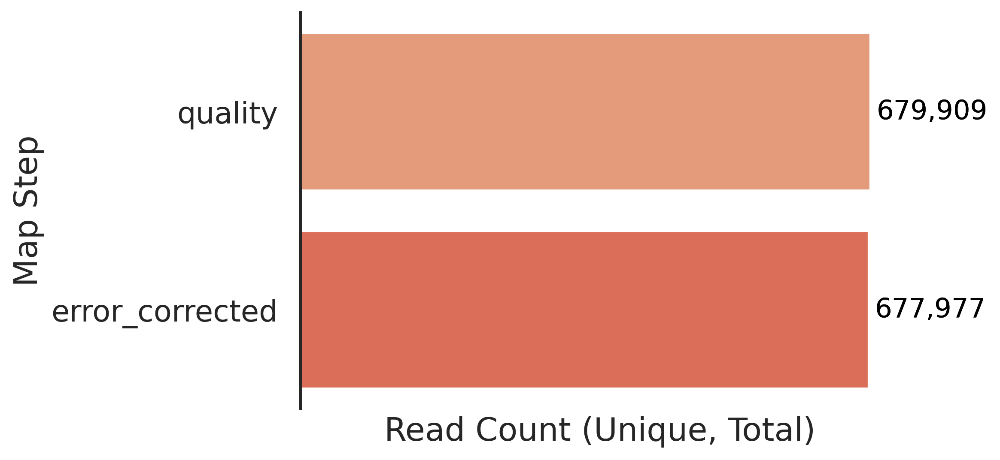

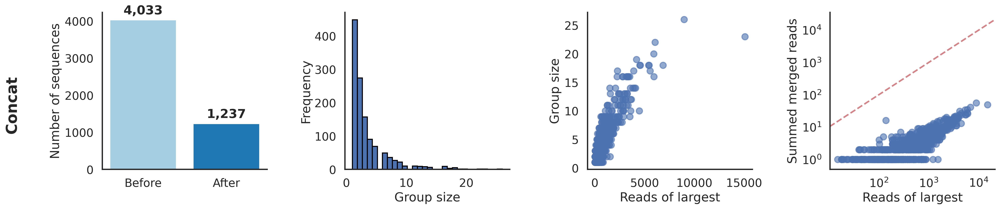

Done in 2.49 seconds.

1237
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.fastq (677977 reads)...


Writing FASTQ: 100%|██████████| 677977/677977 [00:00<00:00, 2122692.49it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.fastq
Done in 0.70 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.27 seconds.

Aligning .FASTQ to reference .FA ...


677977 reads; of these:
  677977 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    677977 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_deduplicated.bam
# job started at Thu Dec 11 13:32:18 2025 on n0001.savio2 -- 4884c2b8-0295-4c83-a2f0-c302f6cc0b7f
# pid: 4038390, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.13 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.49 seconds.

Extracting UMIs (12 bases)...
Done in 0.65 seconds.

Done in 1.58 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_
Full prefix for this instance: umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.59 seconds.


=== Running error correction step on umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a5_RNA_ADBC_S21 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 703190 reads to /global/scratch/projects/fc_m

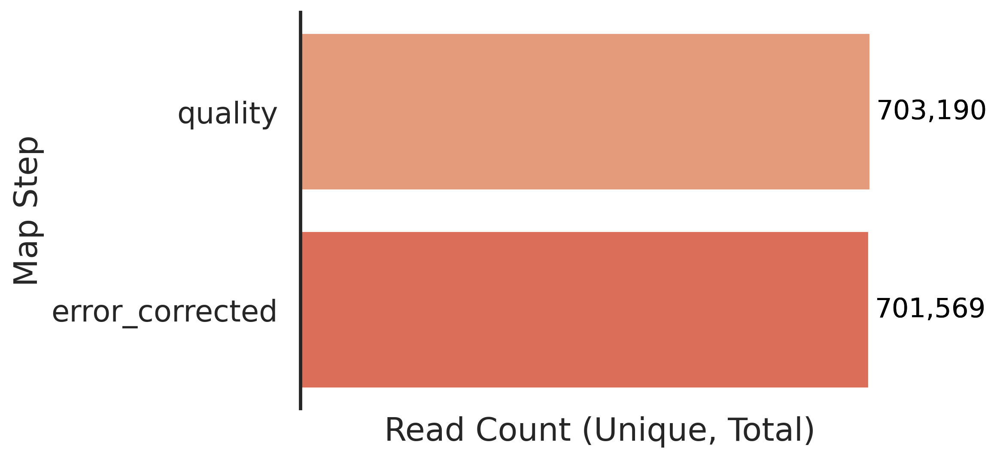

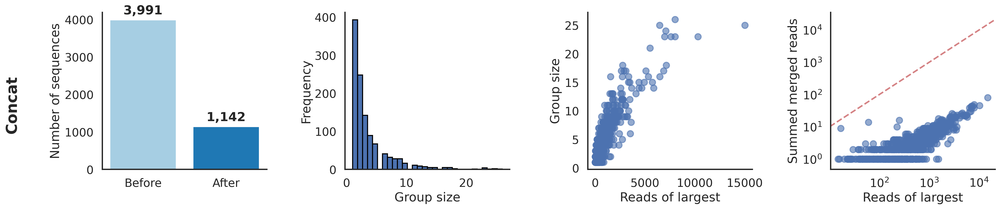

Done in 2.49 seconds.

1142
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.fastq (701569 reads)...


Writing FASTQ: 100%|██████████| 701569/701569 [00:00<00:00, 2156526.73it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.fastq
Done in 0.73 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.66 seconds.

Aligning .FASTQ to reference .FA ...


701569 reads; of these:
  701569 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    701569 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_deduplicated.bam
# job started at Thu Dec 11 13:33:26 2025 on n0001.savio2 -- 9f5cee80-bbc3-41d4-83d7-df10591ad86a
# pid: 4038540, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

In [50]:
for file_path in AD_seq_files:
    
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    # Get the file naeme to use for output
    umi_path = os.path.join(output_path, f"umi_{name_only}")
    print(umi_path)

    # Extract UMIs and barcodes from reads
    umi_mapper = initial_map.InitialMapper(db_path = db_path,
                                       step_name = f"umi_{name_only}", 
                                       seq_file = file_path,
                                       design_file_path = None,
                                       bc_objects = AD_objects,
                                       reverse_complement = True,
                                       umi_length = 12)
    umi_mapper.create_map()

    print("refining")

    key = file_path.split("/")[-1].split(".")[0]
    
    # Only keep barcodes of correct length, then error correct
    refiner = map_refiner.MapRefiner(db_path = db_path,
                                        bc_objects=AD_objects,
                                        column_pairs = [],
                                        reads_threshold = 1,
                                        map_order = ['quality', 'error_corrected'],
                                        step_name=f"umi_{name_only}", 
                                        descriptor = "",
                                    output_figures_path = umi_path,
                                    expected_bc_count = custom_bc_counts[key],
                                    should_check_exists = False,
                                    design_check = False)
    refiner.refine_map_from_db()
    refiner.plot_loss()
    refiner.plot_error_correction()
    error_corrected = refiner.get_map_df('error_corrected')
    print(len(error_corrected[["ADBC2", "HawkBCs"]].drop_duplicates()))
    
    # # Run both deduplications
    deduplicator = umi_deduplicate.UMIDeduplicator(db_path = db_path,
                                                        bc_objects = AD_objects,
                                                        step_name = f"umi_{name_only}", 
                                                        descriptor = "",
                                                        step1_map_name = None,
                                                        fastq_path = file_path,
                                                        umi_length = 12,
                                                        output_path = umi_path)

    deduplicator.run_both_deduplications()

    # Collect results
    one_file_complex_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_directional_umi_counts.tsv"), sep = "\t")
    one_file_complex_results["name"] = name_only
    complex_AD_results.append(one_file_complex_results)

    one_file_simple_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_simple_umi_counts.tsv"), sep = "\t")
    one_file_simple_results["name"] = name_only
    simple_AD_results.append(one_file_simple_results)

# 2. RPTR

## A. Expected barcode counts

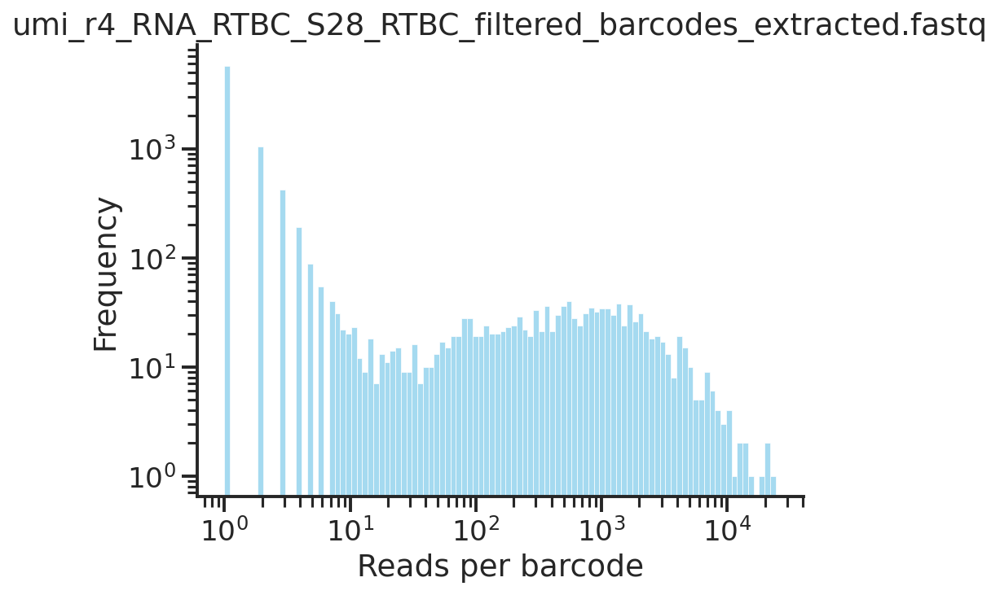

Enter chosen threshold for umi_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted.fastq:  30


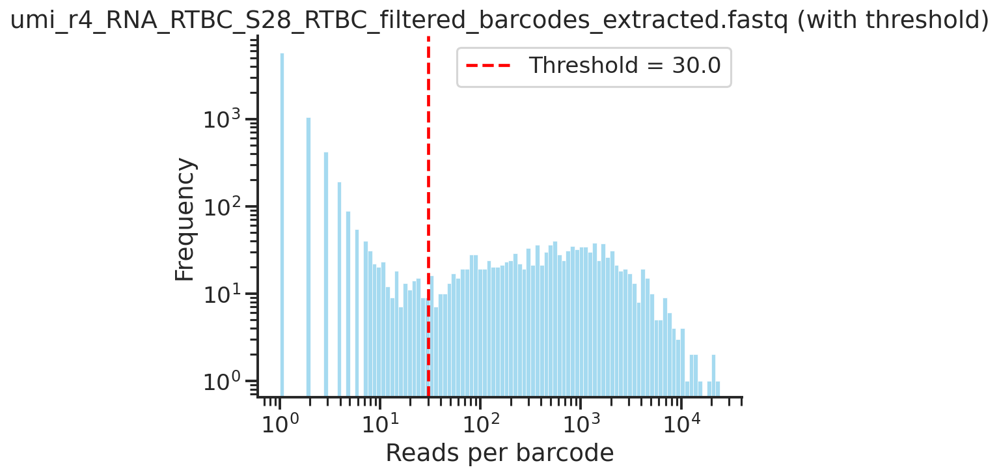

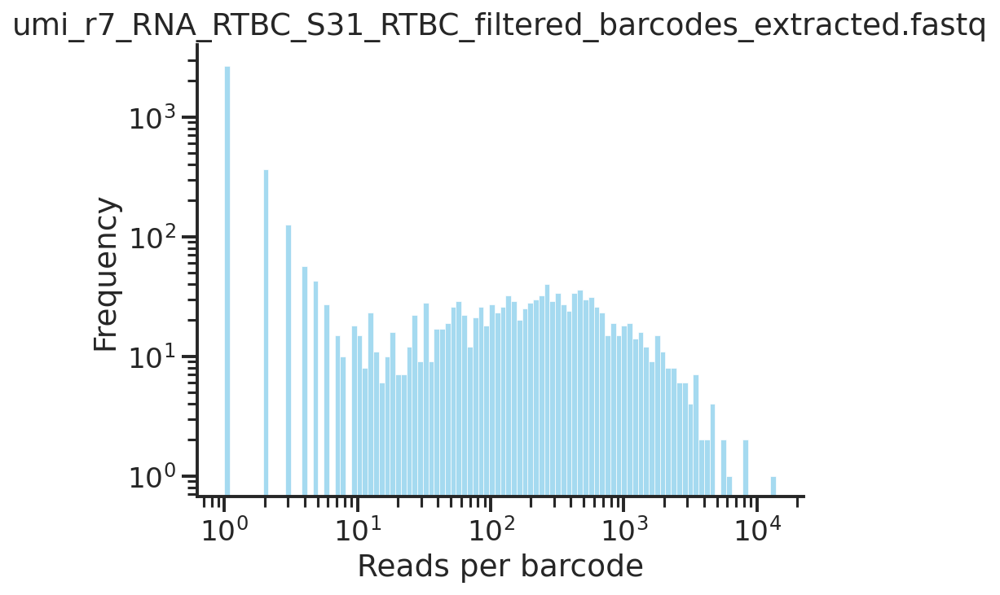

Enter chosen threshold for umi_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted.fastq:  30


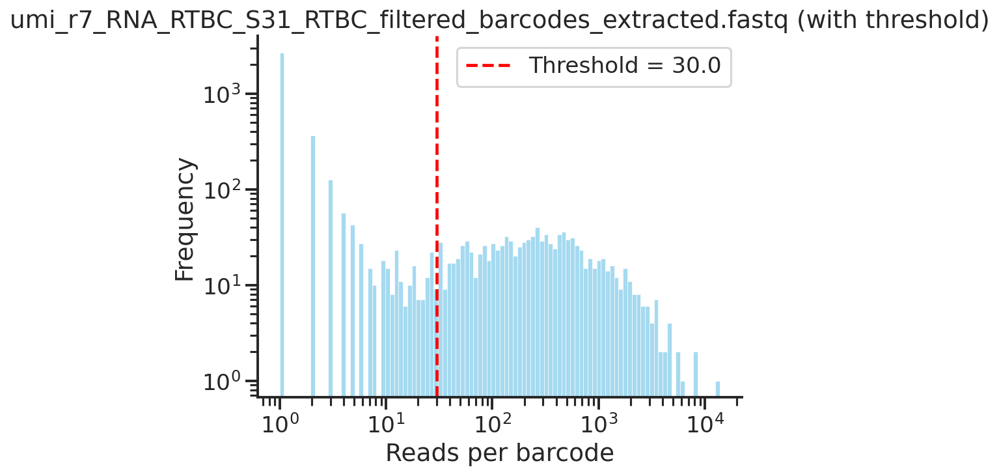

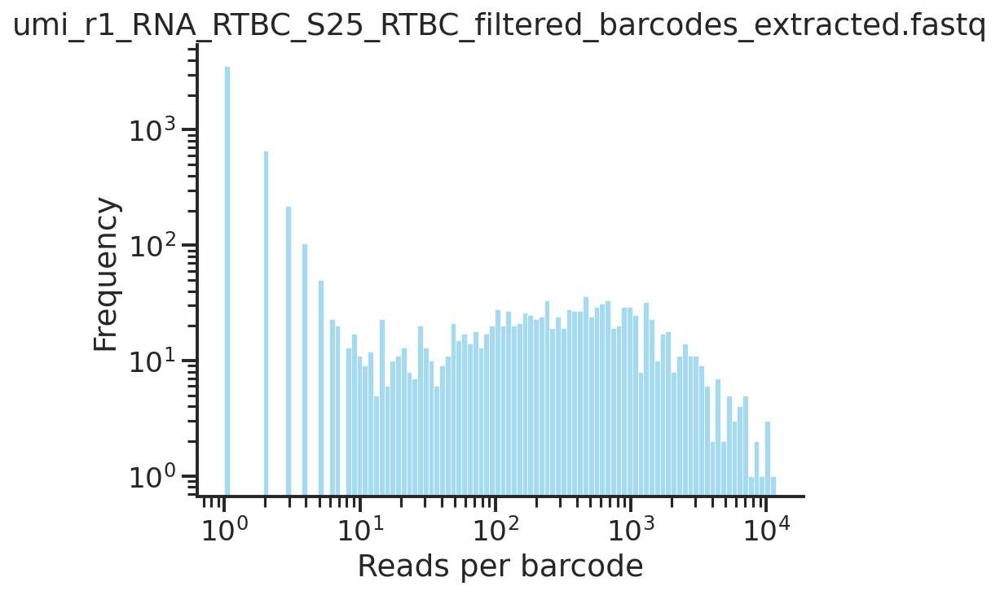

Enter chosen threshold for umi_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted.fastq:  30


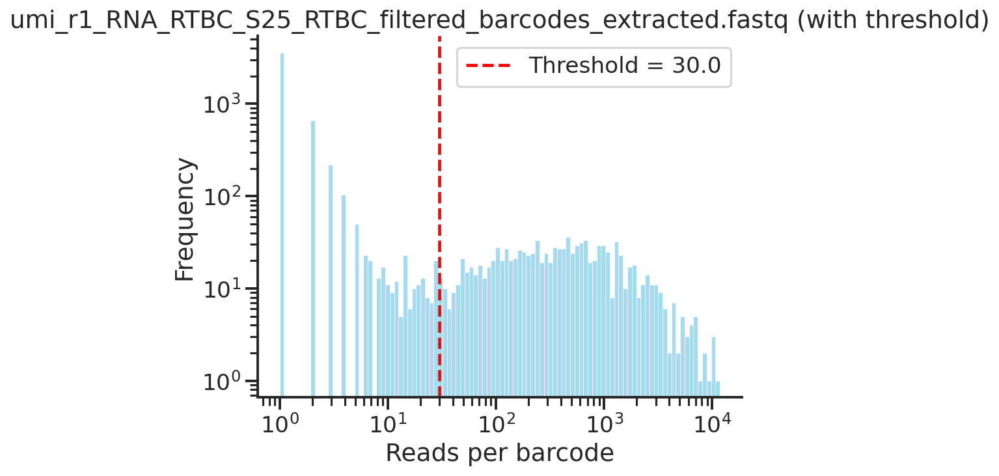

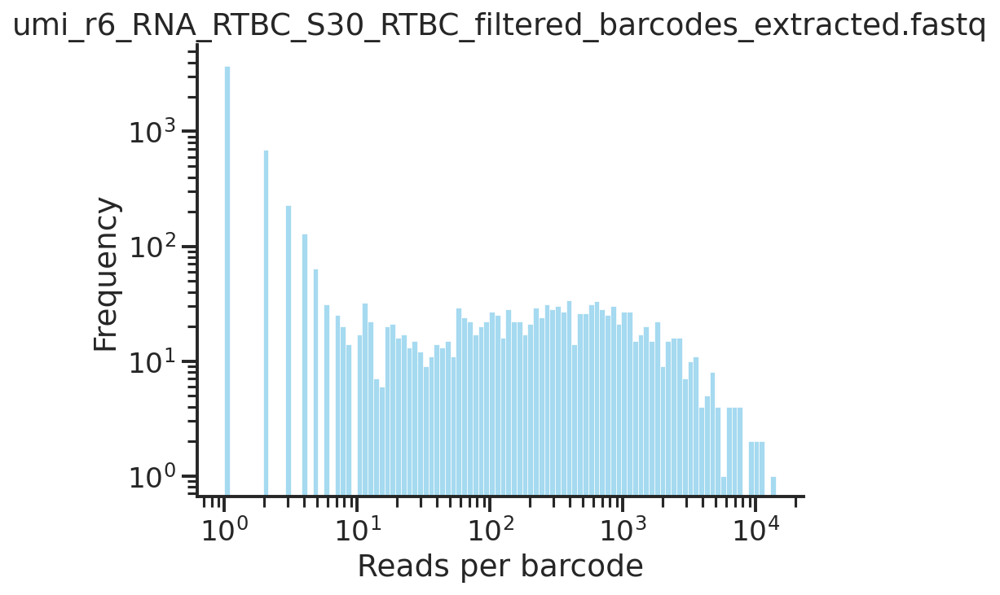

Enter chosen threshold for umi_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted.fastq:  30


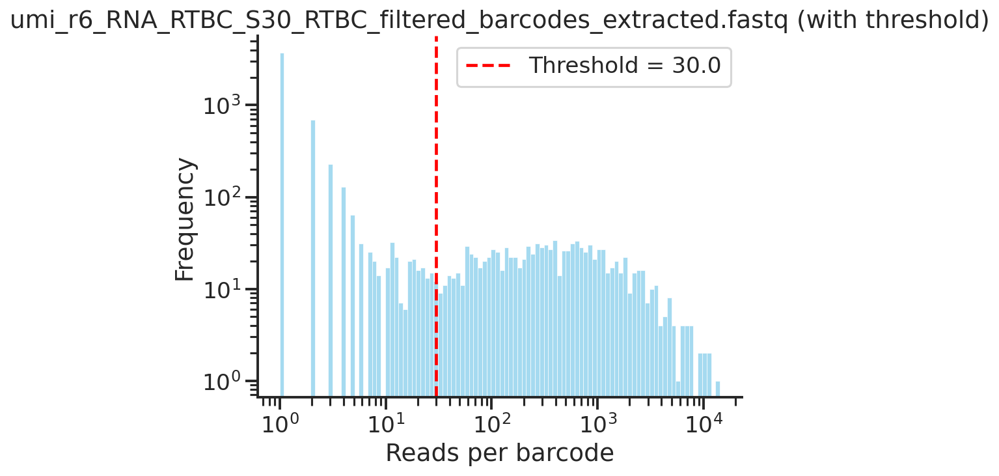

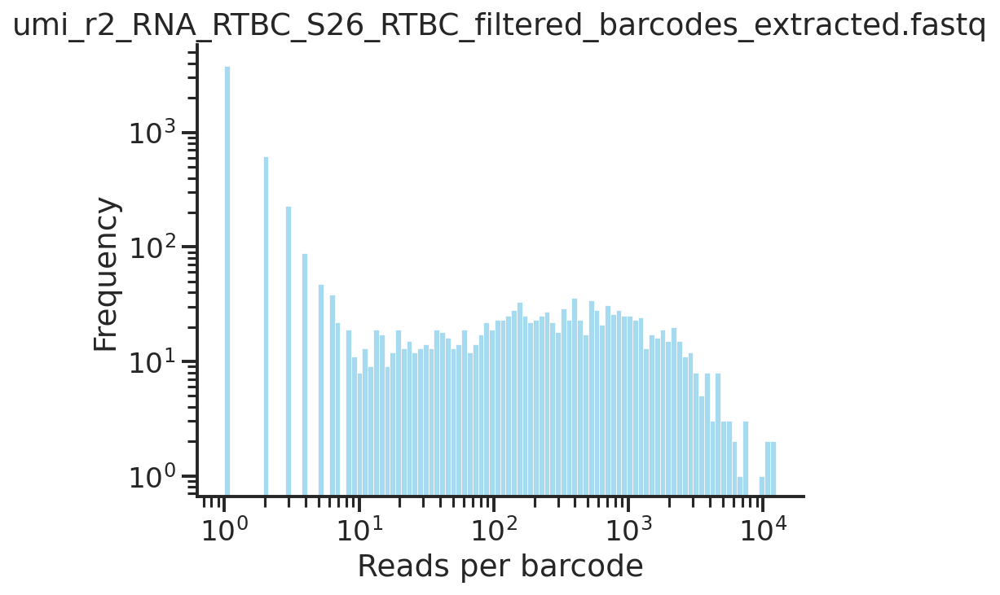

Enter chosen threshold for umi_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted.fastq:  30


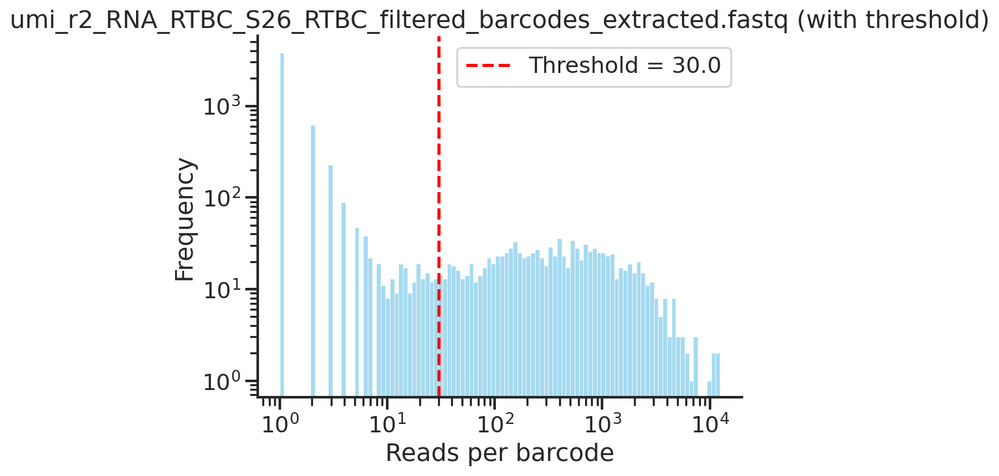

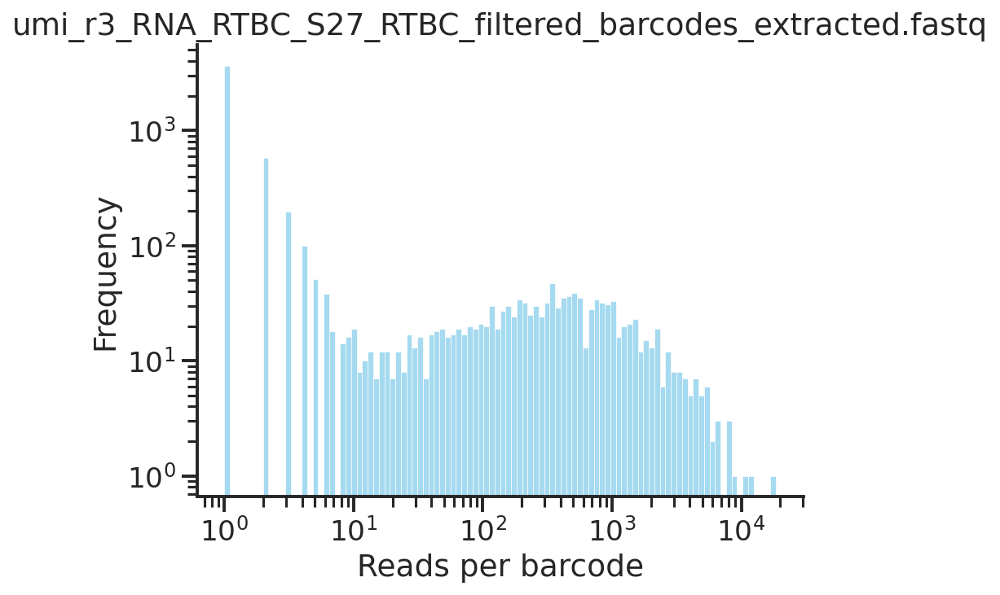

Enter chosen threshold for umi_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted.fastq:  30


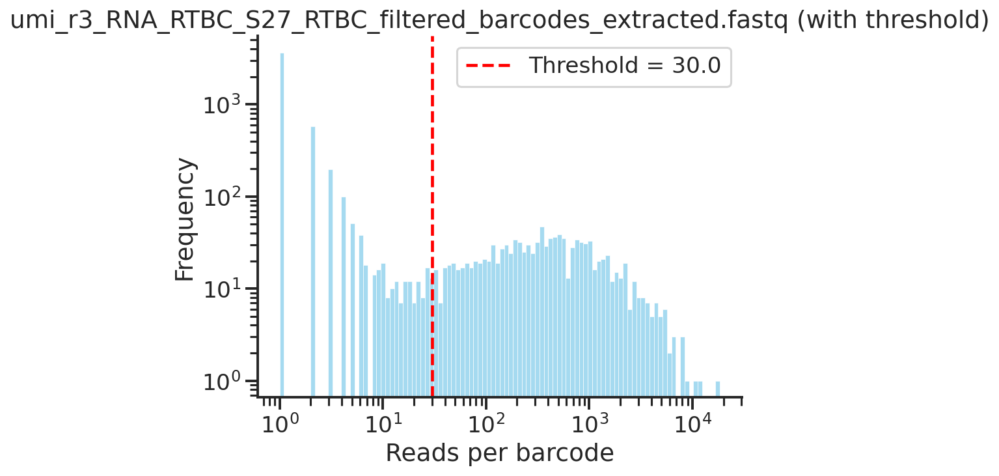

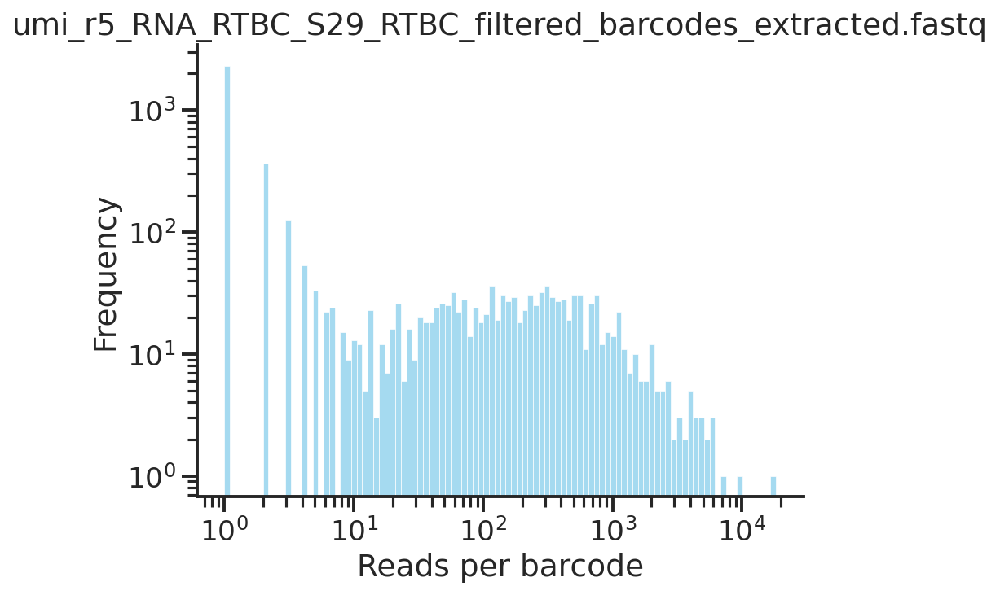

Enter chosen threshold for umi_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted.fastq:  30


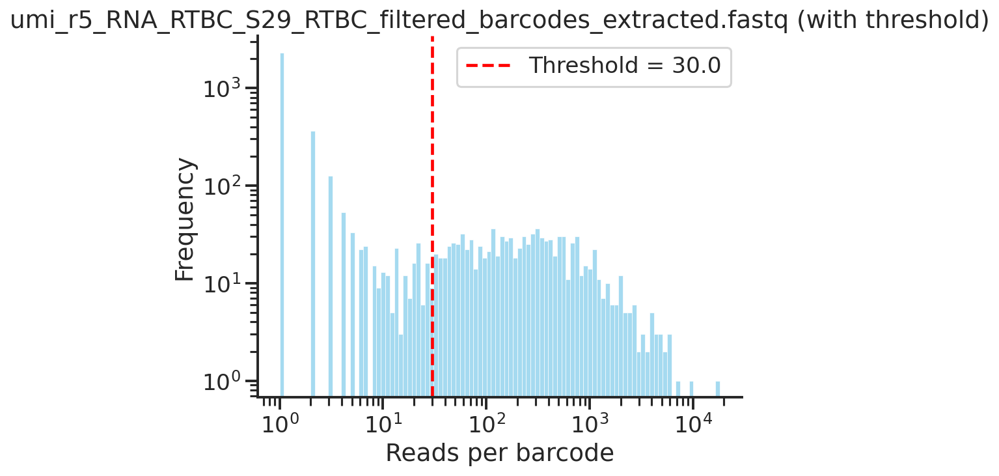

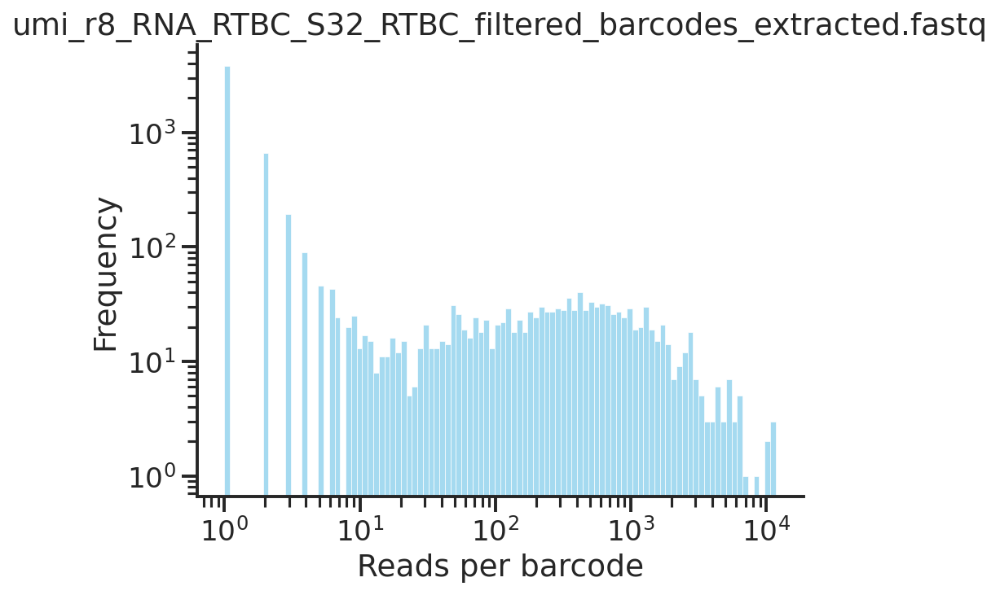

Enter chosen threshold for umi_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted.fastq:  30


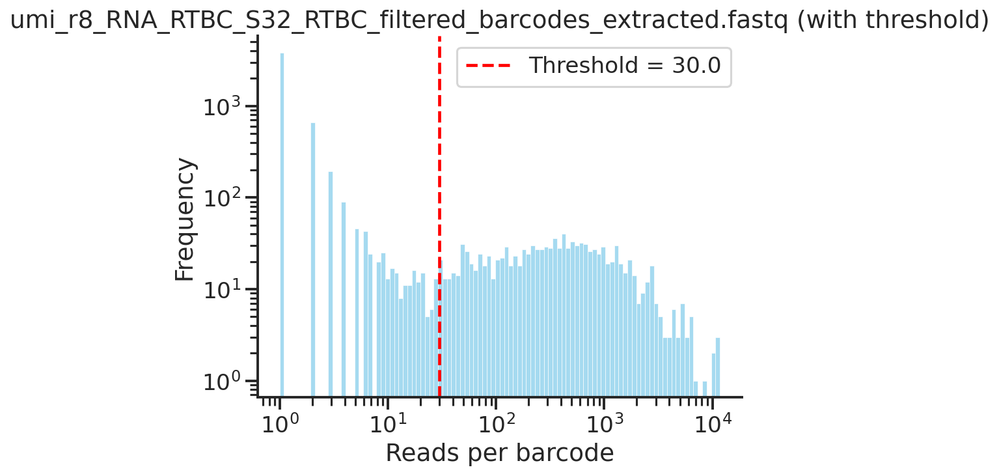

{'r4_RNA_RTBC_S28': 1229,
 'r7_RNA_RTBC_S31': 1066,
 'r1_RNA_RTBC_S25': 1062,
 'r6_RNA_RTBC_S30': 1096,
 'r2_RNA_RTBC_S26': 1078,
 'r3_RNA_RTBC_S27': 1145,
 'r5_RNA_RTBC_S29': 982,
 'r8_RNA_RTBC_S32': 1162}

In [6]:
### sns.set_style('ticks')

RPTR_seq_files = glob.glob(
    "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/*RTBC*/*.fastq"
)

custom_RPTR_bc_counts = {}

for file_path in RPTR_seq_files:
    # Load extracted barcodes
    extracted_barcodes = pd.read_csv(file_path, header=None)
    extracted_barcodes = extracted_barcodes.reset_index()
    extracted_barcodes = extracted_barcodes[(extracted_barcodes["index"] % 4) == 1]
    extracted_barcodes = extracted_barcodes.drop(columns="index")

    # Compute counts per barcode
    counts = extracted_barcodes[0].value_counts()

    # Plot histogram
    plt.figure(dpi=150)
    ax = sns.histplot(counts, log_scale=(True, True), bins=100, color='skyblue')
    sns.despine()
    ax.set_title(file_path.split("/")[-1])
    plt.xlabel("Reads per barcode")
    plt.ylabel("Frequency")
    plt.show()

    # Prompt user to input threshold
    thresh = float(input(f"Enter chosen threshold for {file_path.split('/')[-1]}: "))
    #custom_reads_thresholds[file_path] = thresh

    # Show histogram again with threshold as vertical line
    plt.figure(dpi=150)
    ax = sns.histplot(counts, log_scale=(True, True), bins=100, color='skyblue')
    sns.despine()
    plt.axvline(thresh, color='red', linestyle='--', label=f'Threshold = {thresh}')
    ax.set_title(f"{file_path.split('/')[-1]} (with threshold)")
    plt.xlabel("Reads per barcode")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

    density_bc_count = sum(counts> thresh)
    custom_RPTR_bc_counts[file_path.split("/")[-2][4:]] = density_bc_count

custom_RPTR_bc_counts

**Seems like 30 reads is a good threshold***

## B. Running error correction

In [5]:
RTBC_objects = [step1_RTBC]
RT_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/r*")

In [9]:
complex_RT_results = []
simple_RT_results = []

In [10]:
for file_path in RT_seq_files:
    
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    # Get the file naeme to use for output
    umi_path = os.path.join(output_path, f"umi_{name_only}")
    print(umi_path)

    # # Extract UMIs and barcodes from reads
    # umi_mapper = initial_map.InitialMapper(db_path = db_path,
    #                                    step_name = f"umi_{name_only}", 
    #                                    seq_file = file_path,
    #                                    design_file_path = None,
    #                                    bc_objects = RTBC_objects,
    #                                    reverse_complement = True,
    #                                    umi_length = 12)
    # umi_mapper.create_map()

    # print("refining")

    # key = file_path.split("/")[-1].split(".")[0]
    
    # # Only keep barcodes of correct length, then error correct
    # refiner = map_refiner.MapRefiner(db_path = db_path,
    #                                     bc_objects=RTBC_objects,
    #                                     column_pairs = [],
    #                                     reads_threshold = 1,
    #                                     map_order = ['quality', 'error_corrected'],
    #                                     step_name=f"umi_{name_only}", 
    #                                     descriptor = "",
    #                                 output_figures_path = umi_path,
    #                                 expected_bc_count = custom_RPTR_bc_counts[key])
    # refiner.refine_map_from_db()
    # refiner.plot_loss()
    # refiner.plot_error_correction()
    
    # Run both deduplications
    deduplicator = umi_deduplicate.UMIDeduplicator(db_path = db_path,
                                                        bc_objects = RTBC_objects,
                                                        step_name = f"umi_{name_only}", 
                                                        descriptor = "",
                                                        step1_map_name = None,
                                                        fastq_path = file_path,
                                                        umi_length = 12,
                                                        output_path = umi_path)

    deduplicator.run_both_deduplications()

    # Collect results
    one_file_complex_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_directional_umi_counts.tsv"), sep = "\t")
    one_file_complex_results["name"] = name_only
    complex_RT_results.append(one_file_complex_results)

    one_file_simple_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_simple_umi_counts.tsv"), sep = "\t")
    one_file_simple_results["name"] = name_only
    simple_RT_results.append(one_file_simple_results)

r2_RNA_RTBC_S26
/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.fastq (867889 reads)...


Writing FASTQ: 100%|██████████| 867889/867889 [00:00<00:00, 1764886.84it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.fastq
Done in 1.05 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r2_RNA_RTBC_S26_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 2.40 seconds.

Aligning .FASTQ to reference .FA ...


867889 reads; of these:
  867889 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    867889 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_deduplicated.bam
# job started at Tue Jan  6 17:35:46 2026 on n0112.savio2 -- 0e7140b1-f704-4b5b-a671-a9d2cb6a1378
# pid: 2590161, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 870305/870305 [00:00<00:00, 1817437.76it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.fastq
Done in 1.03 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r8_RNA_RTBC_S32_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.96 seconds.

Aligning .FASTQ to reference .FA ...


870305 reads; of these:
  870305 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    870305 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_deduplicated.bam
# job started at Tue Jan  6 17:36:50 2026 on n0112.savio2 -- 65e86679-2c29-4dd1-aa7a-72968a11d49f
# pid: 2590397, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 593799/593799 [00:00<00:00, 1812095.84it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.fastq
Done in 0.70 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r7_RNA_RTBC_S31_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.60 seconds.

Aligning .FASTQ to reference .FA ...


593799 reads; of these:
  593799 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    593799 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_deduplicated.bam
# job started at Tue Jan  6 17:37:46 2026 on n0112.savio2 -- c731f688-fe3e-4ee7-8692-f2c934f07566
# pid: 2590629, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 887392/887392 [00:00<00:00, 1736346.22it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.fastq
Done in 1.07 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r1_RNA_RTBC_S25_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.44 seconds.

Aligning .FASTQ to reference .FA ...


887392 reads; of these:
  887392 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    887392 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_deduplicated.bam
# job started at Tue Jan  6 17:38:20 2026 on n0112.savio2 -- 0dd9b931-66e3-4146-899a-b224c9d4a320
# pid: 2590821, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 940390/940390 [00:00<00:00, 1768479.17it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.fastq
Done in 1.12 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r6_RNA_RTBC_S30_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.94 seconds.

Aligning .FASTQ to reference .FA ...


940390 reads; of these:
  940390 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    940390 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_deduplicated.bam
# job started at Tue Jan  6 17:39:16 2026 on n0112.savio2 -- 6c2e1120-3fb4-451b-9e47-7a8ba2742dcc
# pid: 2591015, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 884048/884048 [00:00<00:00, 1818378.28it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.fastq
Done in 1.04 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r3_RNA_RTBC_S27_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.90 seconds.

Aligning .FASTQ to reference .FA ...


884048 reads; of these:
  884048 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    884048 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_deduplicated.bam
# job started at Tue Jan  6 17:40:15 2026 on n0112.savio2 -- 5f5f2ce5-223d-45ea-b92d-a0867037a171
# pid: 2591229, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 519659/519659 [00:00<00:00, 1764770.32it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.fastq
Done in 0.62 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r5_RNA_RTBC_S29_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.64 seconds.

Aligning .FASTQ to reference .FA ...


519659 reads; of these:
  519659 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    519659 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_deduplicated.bam
# job started at Tue Jan  6 17:41:03 2026 on n0112.savio2 -- 359ff9c6-28b8-4432-a8f6-df278870abdf
# pid: 2591426, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

Writing FASTQ: 100%|██████████| 1546974/1546974 [00:00<00:00, 1830488.94it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.fastq
Done in 1.81 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r4_RNA_RTBC_S28_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/S

Done in 1.63 seconds.

Aligning .FASTQ to reference .FA ...


1546974 reads; of these:
  1546974 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    1546974 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_deduplicated.bam
# job started at Tue Jan  6 17:41:41 2026 on n0112.savio2 -- aa57adfb-7150-45dc-90d7-8ef771902cea
# pid: 2591636, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detec

# Merge with step1 map

Combining results

In [14]:
all_simple_AD_results_df = pd.concat(simple_AD_results)
all_simple_AD_results_df = all_simple_AD_results_df.rename(columns = {"count" : "AD_umi_count"})
all_simple_AD_results_df["ADBC_concat"] = all_simple_AD_results_df["ADBC2"] + all_simple_AD_results_df["HawkBCs"]
all_simple_AD_results_df["number"] = all_simple_AD_results_df["name"].str[1]
all_simple_AD_results_df

,ADBC2,HawkBCs,AD_umi_count,name,ADBC_concat,number
0,GGTTAT,CACAACTTC,11934,a2_RNA_ADBC_S18,GGTTATCACAACTTC,2
1,CCATAA,CACCGATTG,8914,a2_RNA_ADBC_S18,CCATAACACCGATTG,2
2,GCCTGT,CACAACTTC,7063,a2_RNA_ADBC_S18,GCCTGTCACAACTTC,2
3,AGACTA,CACAACTTC,6691,a2_RNA_ADBC_S18,AGACTACACAACTTC,2
4,CGAGTC,CACAACTTC,6324,a2_RNA_ADBC_S18,CGAGTCCACAACTTC,2
...,...,...,...,...,...,...
1137,TATCAT,ACACTAACC,11,a5_RNA_ADBC_S21,TATCATACACTAACC,5
1138,AATTAC,CATAACAGG,11,a5_RNA_ADBC_S21,AATTACCATAACAGG,5
1139,CGAATG,AGAATTGCG,11,a5_RNA_ADBC_S21,CGAATGAGAATTGCG,5
1140,AATAGT,ATTCTCGCC,10,a5_RNA_ADBC_S21,AATAGTATTCTCGCC,5


In [15]:
AD_results_merged = pd.merge(all_complex_AD_results_df, all_simple_AD_results_df, on = ["ADBC_concat", "name", "number"],suffixes = ("_complex", "_simple"))

In [17]:
all_complex_RT_results_df = pd.concat(complex_RT_results)
all_complex_RT_results_df = all_complex_RT_results_df.rename(columns = {"count" : "RTBC_umi_count", "gene" : "RTBC"})
all_complex_RT_results_df["number"] = all_complex_RT_results_df["name"].str[1]
all_complex_RT_results_df

,RTBC,RTBC_umi_count,name,number
0,TCCTCGAGAGCGATTA,2085,r2_RNA_RTBC_S26,2
1,CGAGCATGAACGGAAT,68,r2_RNA_RTBC_S26,2
2,AAGCATTGCATGCAGT,1455,r2_RNA_RTBC_S26,2
3,GTCGGATATTCATCCA,2145,r2_RNA_RTBC_S26,2
4,CAGAATTAAACCTGAA,1551,r2_RNA_RTBC_S26,2
...,...,...,...,...
1224,TGACCGAGCACCTTGA,37,r4_RNA_RTBC_S28,4
1225,GGTCGCAGAATATGTT,38,r4_RNA_RTBC_S28,4
1226,ATTAATCTTTGTTTTT,34,r4_RNA_RTBC_S28,4
1227,CCCCTATTCCAACTCT,17,r4_RNA_RTBC_S28,4


In [18]:
all_simple_RT_results_df = pd.concat(simple_RT_results)
all_simple_RT_results_df = all_simple_RT_results_df.rename(columns = {"count" : "RTBC_umi_count"})
all_simple_RT_results_df["number"] = all_simple_RT_results_df["name"].str[1]
all_simple_RT_results_df

,RTBC,RTBC_umi_count,name,number
0,TTGACTATAATACATA,9774,r2_RNA_RTBC_S26,2
1,AGATATGCTTCTCGAT,9142,r2_RNA_RTBC_S26,2
2,ATGACAATGAACATAT,8581,r2_RNA_RTBC_S26,2
3,CGAGCCTATAGCATAA,8517,r2_RNA_RTBC_S26,2
4,ATTTTTGAATTTTTAT,7439,r2_RNA_RTBC_S26,2
...,...,...,...,...
1224,AGGTTAGTCTCTGGCA,18,r4_RNA_RTBC_S28,4
1225,GCTCCAAATTACACGA,17,r4_RNA_RTBC_S28,4
1226,TCCATGCACCGAGGTG,17,r4_RNA_RTBC_S28,4
1227,CCCCTATTCCAACTCT,17,r4_RNA_RTBC_S28,4


In [19]:
RT_results_merged = pd.merge(all_complex_RT_results_df, all_simple_RT_results_df, on = ["RTBC", "name", "number"],suffixes = ("_complex", "_simple"))
RT_results_merged

,RTBC,RTBC_umi_count_complex,name,number,RTBC_umi_count_simple
0,TCCTCGAGAGCGATTA,2085,r2_RNA_RTBC_S26,2,2101
1,CGAGCATGAACGGAAT,68,r2_RNA_RTBC_S26,2,68
2,AAGCATTGCATGCAGT,1455,r2_RNA_RTBC_S26,2,1461
3,GTCGGATATTCATCCA,2145,r2_RNA_RTBC_S26,2,2162
4,CAGAATTAAACCTGAA,1551,r2_RNA_RTBC_S26,2,1556
...,...,...,...,...,...
8815,TGACCGAGCACCTTGA,37,r4_RNA_RTBC_S28,4,37
8816,GGTCGCAGAATATGTT,38,r4_RNA_RTBC_S28,4,38
8817,ATTAATCTTTGTTTTT,34,r4_RNA_RTBC_S28,4,35
8818,CCCCTATTCCAACTCT,17,r4_RNA_RTBC_S28,4,17


In [22]:
step1_map = pd.read_csv(step1_csv, index_col = 0)
step1_map

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1
1,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1
2,ACGTAT,AGTGTGCGT,ACAGGCTGTCGCTACC,GCCCAGGACCTGGCCGCCGCCAAGTTCCAGGCCGGCATTCCCTTCA...,3896,True,True,True,True,1
3,TCAGTA,ACCGTTACC,AATGGGCCCGATCTAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,3878,True,True,True,True,1
4,ACGTTA,CCGTGATAC,TGTGCCAATCAAGGCA,ACCGACGCCATCGACGAGGAGGTGGCCATGAGCGCCGTGATCGAGA...,3871,True,True,True,True,1
...,...,...,...,...,...,...,...,...,...,...
1486,CGGATT,ACGCAATCC,TGTAGGCCCGATAGCT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,335,True,True,True,True,1
1487,TAATTC,AAGCTGCGA,GGATCTGCAGCTCTGA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,308,True,True,True,True,1
1488,TCACAG,AGTCCTCCT,TATTAACTACGAAAAA,TATCCCACCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGGC...,255,True,True,True,True,1
1489,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1


In [23]:
# Concatenated ADBC2 and HawkBC
step1_map["ADBC_concat"] = step1_map["ADBC2"] + step1_map["HawkBCs"] 
step1_map

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC
1,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT
2,ACGTAT,AGTGTGCGT,ACAGGCTGTCGCTACC,GCCCAGGACCTGGCCGCCGCCAAGTTCCAGGCCGGCATTCCCTTCA...,3896,True,True,True,True,1,ACGTATAGTGTGCGT
3,TCAGTA,ACCGTTACC,AATGGGCCCGATCTAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,3878,True,True,True,True,1,TCAGTAACCGTTACC
4,ACGTTA,CCGTGATAC,TGTGCCAATCAAGGCA,ACCGACGCCATCGACGAGGAGGTGGCCATGAGCGCCGTGATCGAGA...,3871,True,True,True,True,1,ACGTTACCGTGATAC
...,...,...,...,...,...,...,...,...,...,...,...
1486,CGGATT,ACGCAATCC,TGTAGGCCCGATAGCT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,335,True,True,True,True,1,CGGATTACGCAATCC
1487,TAATTC,AAGCTGCGA,GGATCTGCAGCTCTGA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,308,True,True,True,True,1,TAATTCAAGCTGCGA
1488,TCACAG,AGTCCTCCT,TATTAACTACGAAAAA,TATCCCACCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGGC...,255,True,True,True,True,1,TCACAGAGTCCTCCT
1489,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA


In [25]:
# Add simple AD UMI counts to step1 map
step1_map_with_AD = pd.merge(step1_map, AD_results_merged).drop_duplicates()
step1_map_with_AD

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat,AD_umi_count_complex,name,number,AD_umi_count_simple
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,107,a2_RNA_ADBC_S18,2,107
1,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,148,a7_RNA_ADBC_S23,7,149
2,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,78,a1_RNA_ADBC_S17,1,79
3,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,136,a3_RNA_ADBC_S19,3,137
4,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,65,a6_RNA_ADBC_S22,6,65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7244,GATATA,CAGCCTCAA,ACATACCGTAAAGATG,GCCCAGGACCTGAGCAGCAGCACCTTCCAGGCCGGCATTCCCTTCA...,348,True,True,True,True,1,GATATACAGCCTCAA,236,a5_RNA_ADBC_S21,5,237
7245,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA,35,a7_RNA_ADBC_S23,7,35
7246,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA,77,a3_RNA_ADBC_S19,3,78
7247,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA,33,a4_RNA_ADBC_S20,4,33


In [27]:
# Add RPTR UMI counts to step1 map
step1_map_with_RPTR = pd.merge(step1_map, RT_results_merged).drop_duplicates()
step1_map_with_RPTR

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat,RTBC_umi_count_complex,name,number,RTBC_umi_count_simple
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,179,r2_RNA_RTBC_S26,2,179
1,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,259,r8_RNA_RTBC_S32,8,263
2,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,171,r7_RNA_RTBC_S31,7,172
3,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,84,r1_RNA_RTBC_S25,1,84
4,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC,163,r6_RNA_RTBC_S30,6,164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,GATATA,CAGCCTCAA,ACATACCGTAAAGATG,GCCCAGGACCTGAGCAGCAGCACCTTCCAGGCCGGCATTCCCTTCA...,348,True,True,True,True,1,GATATACAGCCTCAA,115,r5_RNA_RTBC_S29,5,116
7107,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA,74,r8_RNA_RTBC_S32,8,74
7108,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA,28,r7_RNA_RTBC_S31,7,28
7109,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA,82,r3_RNA_RTBC_S27,3,82


In [28]:
merge_cols = set(step1_map_with_AD.columns) & set(step1_map_with_RPTR.columns)
merge_cols = [col for col in list(merge_cols) if col != "name"]
merge_cols

['count',
 'HawkBCs',
 'ADBC_concat',
 'ADBC2_qual',
 'AD_qual',
 'RTBC',
 'RTBC_qual',
 'AD',
 'number',
 'Designed',
 'HawkBCs_qual',
 'ADBC2']

In [29]:
step1_map_with_AD_RPTR = pd.merge(step1_map_with_AD, step1_map_with_RPTR, on = merge_cols, how = 'outer', suffixes = ("_AD", "_RPTR"))
step1_map_with_AD_RPTR = step1_map_with_AD_RPTR.fillna(0)
step1_map_with_AD_RPTR

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat,AD_umi_count_complex,name_AD,number,AD_umi_count_simple,RTBC_umi_count_complex,name_RPTR,RTBC_umi_count_simple
0,ATTTGT,CCATCGACA,TAACCTAGCTTCGTCG,GACTCTCCCGGACCCGGCGCCACACCTCACGACAGCGCTCCCTACG...,223,True,True,True,True,1,ATTTGTCCATCGACA,13.0,a3_RNA_ADBC_S19,3,13.0,32.0,r3_RNA_RTBC_S27,32.0
1,ATTTGT,CCATCGACA,TAACCTAGCTTCGTCG,GACTCTCCCGGACCCGGCGCCACACCTCACGACAGCGCTCCCTACG...,223,True,True,True,True,1,ATTTGTCCATCGACA,0.0,0,4,0.0,23.0,r4_RNA_RTBC_S28,23.0
2,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,TAATGCCAGTGCATT,128.0,a1_RNA_ADBC_S17,1,128.0,103.0,r1_RNA_RTBC_S25,105.0
3,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,TAATGCCAGTGCATT,155.0,a2_RNA_ADBC_S18,2,155.0,157.0,r2_RNA_RTBC_S26,157.0
4,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,TAATGCCAGTGCATT,20.0,a3_RNA_ADBC_S19,3,20.0,26.0,r3_RNA_RTBC_S27,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7482,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,CCATAACACCGATTG,9991.0,a4_RNA_ADBC_S20,4,10183.0,13152.0,r4_RNA_RTBC_S28,13556.0
7483,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,CCATAACACCGATTG,7380.0,a5_RNA_ADBC_S21,5,7509.0,2317.0,r5_RNA_RTBC_S29,2334.0
7484,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,CCATAACACCGATTG,6747.0,a6_RNA_ADBC_S22,6,6819.0,4758.0,r6_RNA_RTBC_S30,4832.0
7485,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,CCATAACACCGATTG,9297.0,a7_RNA_ADBC_S23,7,9455.0,8018.0,r7_RNA_RTBC_S31,8203.0


In [30]:
# Now, break down into a better more manageable table
# 1	R1N 24
# 2	R1incuded 24
# 3	R2N 24
# 4	R2Induced 24
# 5	R1N 48
# 6	R1incuded 48
# 7	R2N 48
# 8	R2Induced 48

# Define a mapping for each attribute
mapping = {
    "1": {"Replicate": "R1", "Induced": "No",  "Time": 24},
    "2": {"Replicate": "R1", "Induced": "Yes", "Time": 24},
    "3": {"Replicate": "R2", "Induced": "No",  "Time": 24},
    "4": {"Replicate": "R2", "Induced": "Yes", "Time": 24},
    "5": {"Replicate": "R1", "Induced": "No",  "Time": 48},
    "6": {"Replicate": "R1", "Induced": "Yes", "Time": 48},
    "7": {"Replicate": "R2", "Induced": "No",  "Time": 48},
    "8": {"Replicate": "R2", "Induced": "Yes", "Time": 48},
}

# Expand mapping into separate columns
step1_map_with_AD_RPTR = step1_map_with_AD_RPTR.join(step1_map_with_AD_RPTR["number"].map(mapping).apply(pd.Series))
step1_map_with_AD_RPTR

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,...,AD_umi_count_complex,name_AD,number,AD_umi_count_simple,RTBC_umi_count_complex,name_RPTR,RTBC_umi_count_simple,Replicate,Induced,Time
0,ATTTGT,CCATCGACA,TAACCTAGCTTCGTCG,GACTCTCCCGGACCCGGCGCCACACCTCACGACAGCGCTCCCTACG...,223,True,True,True,True,1,...,13.0,a3_RNA_ADBC_S19,3,13.0,32.0,r3_RNA_RTBC_S27,32.0,R2,No,24
1,ATTTGT,CCATCGACA,TAACCTAGCTTCGTCG,GACTCTCCCGGACCCGGCGCCACACCTCACGACAGCGCTCCCTACG...,223,True,True,True,True,1,...,0.0,0,4,0.0,23.0,r4_RNA_RTBC_S28,23.0,R2,Yes,24
2,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,...,128.0,a1_RNA_ADBC_S17,1,128.0,103.0,r1_RNA_RTBC_S25,105.0,R1,No,24
3,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,...,155.0,a2_RNA_ADBC_S18,2,155.0,157.0,r2_RNA_RTBC_S26,157.0,R1,Yes,24
4,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,...,20.0,a3_RNA_ADBC_S19,3,20.0,26.0,r3_RNA_RTBC_S27,26.0,R2,No,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7482,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,9991.0,a4_RNA_ADBC_S20,4,10183.0,13152.0,r4_RNA_RTBC_S28,13556.0,R2,Yes,24
7483,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,7380.0,a5_RNA_ADBC_S21,5,7509.0,2317.0,r5_RNA_RTBC_S29,2334.0,R1,No,48
7484,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,6747.0,a6_RNA_ADBC_S22,6,6819.0,4758.0,r6_RNA_RTBC_S30,4832.0,R1,Yes,48
7485,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,9297.0,a7_RNA_ADBC_S23,7,9455.0,8018.0,r7_RNA_RTBC_S31,8203.0,R2,No,48


In [31]:
# Final results 
final_results = step1_map_with_AD_RPTR
final_results

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,...,AD_umi_count_complex,name_AD,number,AD_umi_count_simple,RTBC_umi_count_complex,name_RPTR,RTBC_umi_count_simple,Replicate,Induced,Time
0,ATTTGT,CCATCGACA,TAACCTAGCTTCGTCG,GACTCTCCCGGACCCGGCGCCACACCTCACGACAGCGCTCCCTACG...,223,True,True,True,True,1,...,13.0,a3_RNA_ADBC_S19,3,13.0,32.0,r3_RNA_RTBC_S27,32.0,R2,No,24
1,ATTTGT,CCATCGACA,TAACCTAGCTTCGTCG,GACTCTCCCGGACCCGGCGCCACACCTCACGACAGCGCTCCCTACG...,223,True,True,True,True,1,...,0.0,0,4,0.0,23.0,r4_RNA_RTBC_S28,23.0,R2,Yes,24
2,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,...,128.0,a1_RNA_ADBC_S17,1,128.0,103.0,r1_RNA_RTBC_S25,105.0,R1,No,24
3,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,...,155.0,a2_RNA_ADBC_S18,2,155.0,157.0,r2_RNA_RTBC_S26,157.0,R1,Yes,24
4,TAATGC,CAGTGCATT,TGAAAGATATTTCCAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,224,True,True,True,True,1,...,20.0,a3_RNA_ADBC_S19,3,20.0,26.0,r3_RNA_RTBC_S27,26.0,R2,No,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7482,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,9991.0,a4_RNA_ADBC_S20,4,10183.0,13152.0,r4_RNA_RTBC_S28,13556.0,R2,Yes,24
7483,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,7380.0,a5_RNA_ADBC_S21,5,7509.0,2317.0,r5_RNA_RTBC_S29,2334.0,R1,No,48
7484,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,6747.0,a6_RNA_ADBC_S22,6,6819.0,4758.0,r6_RNA_RTBC_S30,4832.0,R1,Yes,48
7485,CCATAA,CACCGATTG,CAGCGTTTAACAAGCG,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,11926,True,True,True,True,1,...,9297.0,a7_RNA_ADBC_S23,7,9455.0,8018.0,r7_RNA_RTBC_S31,8203.0,R2,No,48


In [32]:
#231 distinct ADs in final results
final_results["Designed"].value_counts()

Designed
1    7487
Name: count, dtype: int64

In [35]:
final_results.to_csv("/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat_custom_threshold/results_with_step1.csv")

# Reads loss

umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_error_corrected step1 count: 578383
umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_error_corrected step1 count: 675324
umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_error_corrected step1 count: 601121
umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_error_corrected step1 count: 551838
umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_error_corrected step1 count: 613743
umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_error_corrected step1 count: 523736
umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_error_corrected step1 count: 486189
umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_error_corrected step1 count: 600105


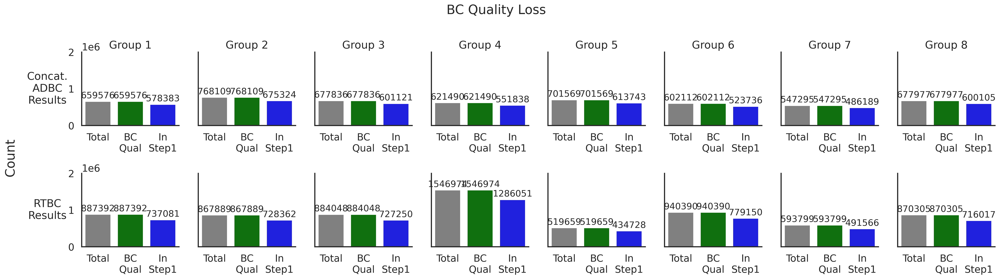

In [15]:
step1_map = pd.read_csv(step1_csv, index_col = 0)
step1_map

fig, axes = plt.subplots(2, 8, figsize=(24,6), dpi=300, sharey=True, sharex = False)
axes = axes.flatten()  # flatten to index easily 0..15

# First row: AD (ADBC/HawkBCs)
for i in np.arange(1, 9):
    file_name = f'umi_a{i}_RNA_ADBC_S{16 + i}_ADBC2_HawkBCs_error_corrected'
    df = refiner.get_map_df(file_name)
    
    total_count = len(df)
    both_true = ((df["ADBC2_qual"]) & (df["HawkBCs_qual"])).sum()
    step1_count = len(df[(df["ADBC2"].isin(step1_map["ADBC2"])) & (df["HawkBCs"].isin(step1_map["HawkBCs"]))])
    print(f"{file_name} step1 count: {step1_count}")

    plot_counts = pd.DataFrame({
        "Category": ["Total", "BC\nQual", "In\nStep1"],
        "Count": [total_count, both_true, step1_count]
    })

    ax = axes[i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=["gray", "green", "blue"])
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    ax.set_title("Group " + str(file_name[:6][-1]), fontsize='medium')
    ax.set_xlabel("")
    ax.set_ylabel("")

# Second row: RPTR (RTBC)
for i in np.arange(1, 9):
    file_name = f'umi_r{i}_RNA_RTBC_S{24 + i}_RTBC_error_corrected'
    df = refiner.get_map_df(file_name)
    
    total_count = len(df)
    true_count = df["RTBC_qual"].sum()  # assuming boolean True/False
    step1_count = len(df[df["RTBC"].isin(step1_map["RTBC"])])
   
    plot_counts = pd.DataFrame({
        "Category": ["Total", "BC\nQual", "In\nStep1"],
        "Count": [total_count, true_count, step1_count]
    })

    ax = axes[8 + i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=["gray", "green", "blue"])
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    #ax.set_title(file_name[:6], fontsize='medium')
    ax.set_xlabel("")
    ax.set_ylabel("")

axes[0].set_ylabel("Concat.\nADBC\nResults", rotation = 0, labelpad = 35, va = 'center')
axes[8].set_ylabel("RTBC\nResults", rotation = 0, labelpad = 35, va = 'center')

axes[0].set_ylim(0, 2000000)
fig.supylabel("Count")
sns.despine()
plt.tight_layout(pad = 1)
fig.suptitle("BC Quality Loss", y = 1.1)
plt.savefig(os.path.join(output_path, f"bc_quality_loss.png"))
plt.show()

umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_
umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_
umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_
umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_
umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_
umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_
umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_
umi_r1_RNA_RTBC_S25_RTBC_
umi_r2_RNA_RTBC_S26_RTBC_
umi_r3_RNA_RTBC_S27_RTBC_
umi_r4_RNA_RTBC_S28_RTBC_
umi_r5_RNA_RTBC_S29_RTBC_
umi_r6_RNA_RTBC_S30_RTBC_
umi_r7_RNA_RTBC_S31_RTBC_
umi_r8_RNA_RTBC_S32_RTBC_


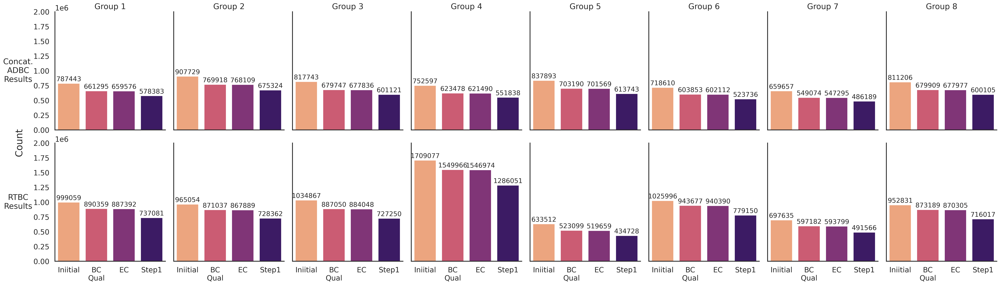

In [29]:
step1_map = pd.read_csv(step1_csv, index_col = 0)

palette = sns.color_palette('magma_r', n_colors = 4)

fig, axes = plt.subplots(2, 8, figsize=(32,9), dpi=300, sharey=True, sharex = True)
axes = axes.flatten()  # flatten to index easily 0..15

# First row: AD (ADBC/HawkBCs)
for i in np.arange(1, 9):
    file_prefix = f'umi_a{i}_RNA_ADBC_S{16 + i}_ADBC2_HawkBCs_'
    print(file_prefix)
    
    initial_df = refiner.get_map_df(file_prefix + "initial")
    quality_df = refiner.get_map_df(file_prefix + "quality")
    ec_df = refiner.get_map_df(file_prefix + "error_corrected")
    
    init_count = len(initial_df)
    qual_count = len(quality_df)
    ec_count = len(ec_df)
    step1_count = len(ec_df[(ec_df["ADBC2"].isin(step1_map["ADBC2"])) & (ec_df["HawkBCs"].isin(step1_map["HawkBCs"]))])

    plot_counts = pd.DataFrame({
        "Category": ["Iniitial", "BC\nQual", "EC", "Step1"],
        "Count": [init_count, qual_count, ec_count, step1_count]
    })

    ax = axes[i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=palette)
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    ax.set_title("Group " + str(file_prefix[:6][-1]), fontsize='medium')
    ax.set_xlabel("")
    ax.set_ylabel("")

# Second row: RPTR (RTBC)
for i in np.arange(1, 9):
    file_prefix = f'umi_r{i}_RNA_RTBC_S{24 + i}_RTBC_'
    print(file_prefix)
    
    initial_df = refiner.get_map_df(file_prefix + "initial")
    quality_df = refiner.get_map_df(file_prefix + "quality")
    ec_df = refiner.get_map_df(file_prefix + "error_corrected")
    
    init_count = len(initial_df)
    qual_count = len(quality_df)
    ec_count = len(ec_df)
    step1_count = len(ec_df[(ec_df["RTBC"].isin(step1_map["RTBC"]))])

    plot_counts = pd.DataFrame({
        "Category": ["Iniitial", "BC\nQual", "EC", "Step1"],
        "Count": [init_count, qual_count, ec_count, step1_count]
    })

    ax = axes[8 + i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=palette)
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    ax.set_xlabel("")
    ax.set_ylabel("")

axes[0].set_ylabel("Concat.\nADBC\nResults", rotation = 0, labelpad = 35, va = 'center')
axes[8].set_ylabel("RTBC\nResults", rotation = 0, labelpad = 35, va = 'center')

axes[0].set_ylim(0, 2000000)
fig.supylabel("Count")
sns.despine()
plt.tight_layout(pad = 0.25)
# fig.suptitle("BC Quality Loss", y = 1.1)
# plt.savefig(os.path.join(output_path, f"bc_quality_loss.png"))
# plt.show()

# As a comparison, what if I did thresholded with same thresholds, but no error correction. How many more reads am I saving with error correction?

In [31]:
db_path_no_ec = os.path.join(output_path, "NKX2-2_CC_UMI_reads_threshold_no_ec.db")

a2_RNA_ADBC_S18
Reading 1 FASTQ/TXT file(s)...
Done in 1.57 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.71 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.45 seconds.

Extracting UMIs (12 bases)...
Done in 0.60 seconds.

Done in 1.78 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
Full prefix for this instance: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.61 seconds.

Grouping umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality...


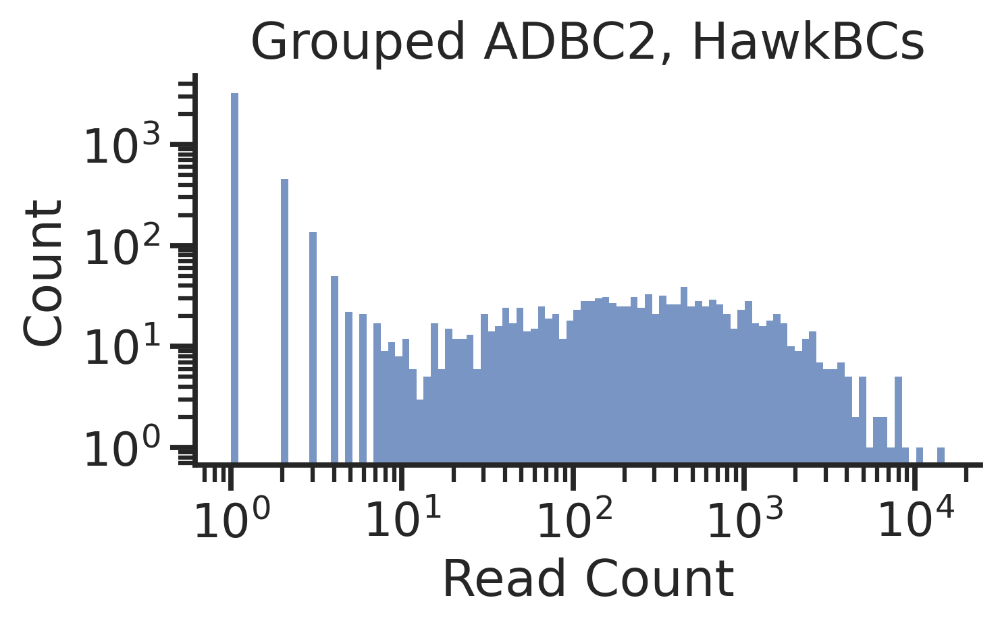

Done in 1.11 seconds.

Thresholding...
Using reads threshold of 15.


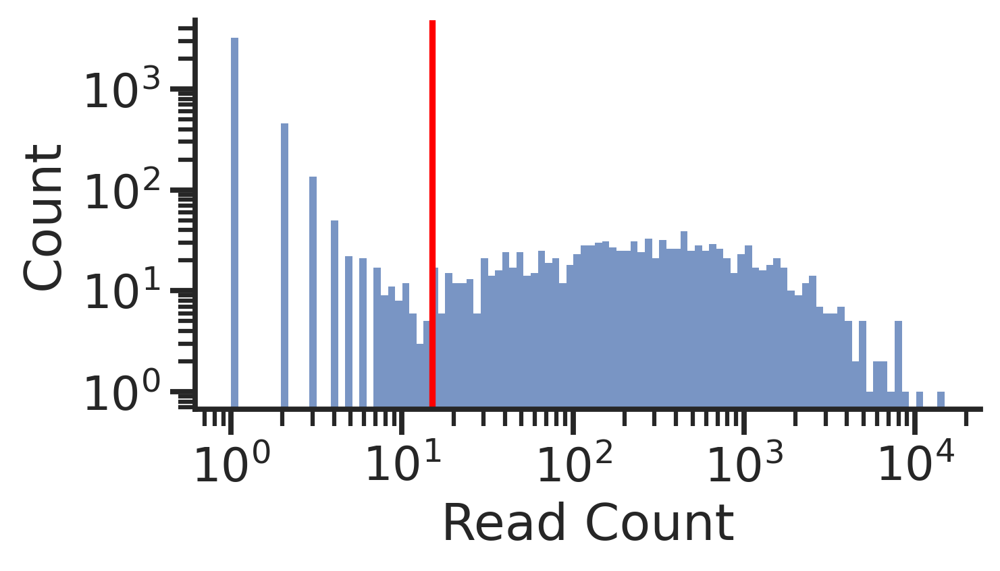

Done in 0.52 seconds.

Done.
Saved loss summary table as 'umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_loss_summary'
Done in 0.02 seconds.

a7_RNA_ADBC_S23
Reading 1 FASTQ/TXT file(s)...
Done in 1.50 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.69 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 2.56 seconds.

Extracting UMIs (12 bases)...
Done in 0.44 seconds.

Done in 1.18 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_
Full prefix for this instance: umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.44 seconds.

Grouping umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_quality...


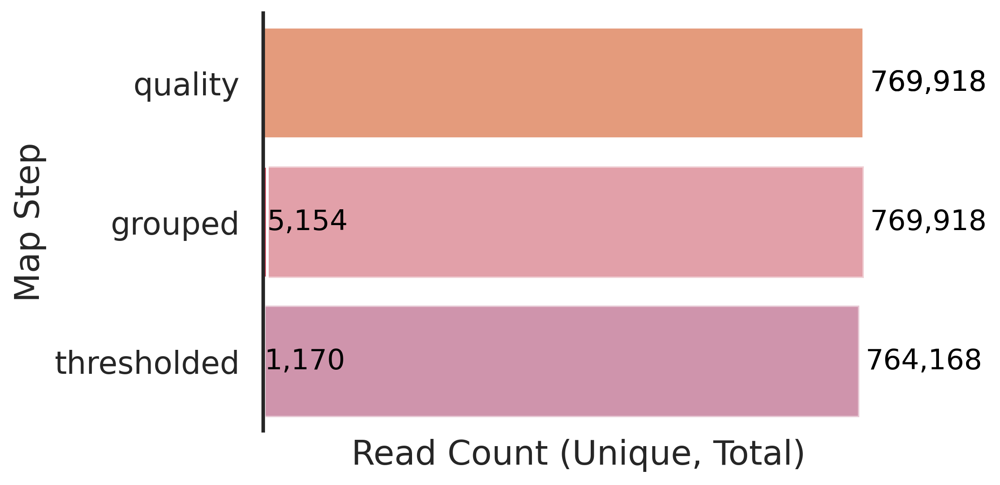

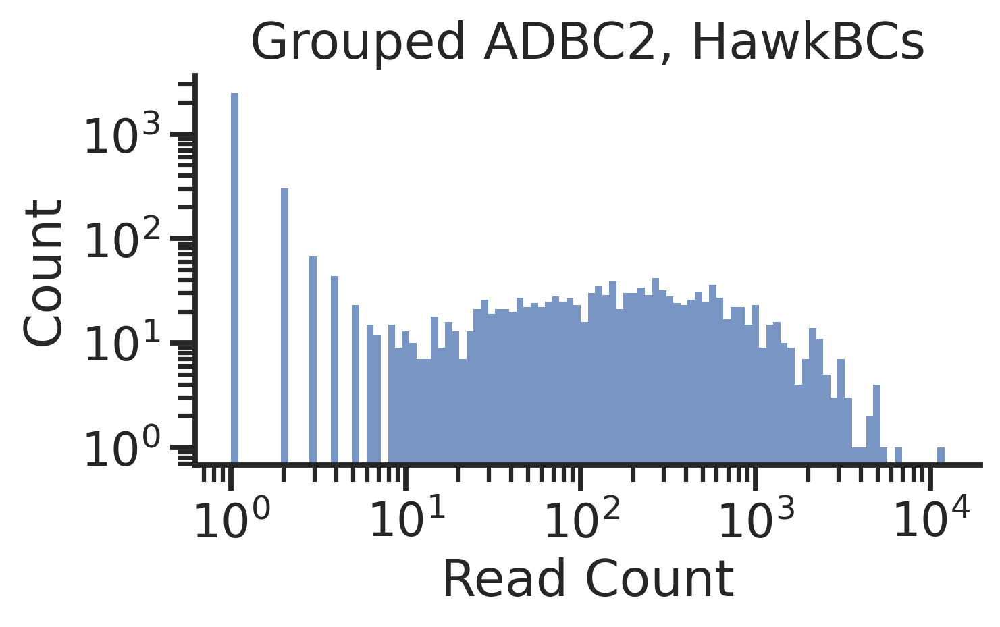

Done in 0.73 seconds.

Thresholding...
Using reads threshold of 15.


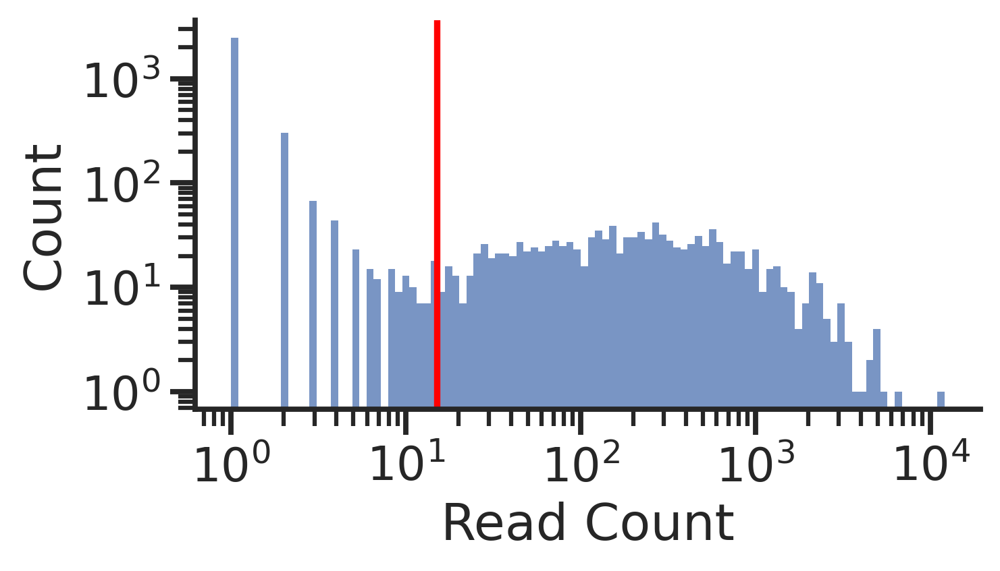

Done in 0.47 seconds.

Done.
Saved loss summary table as 'umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

a1_RNA_ADBC_S17
Reading 1 FASTQ/TXT file(s)...
Done in 1.66 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.66 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 2.99 seconds.

Extracting UMIs (12 bases)...
Done in 0.51 seconds.

Done in 1.41 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_
Full prefix for this instance: umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.53 seconds.

Grouping umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_quality...


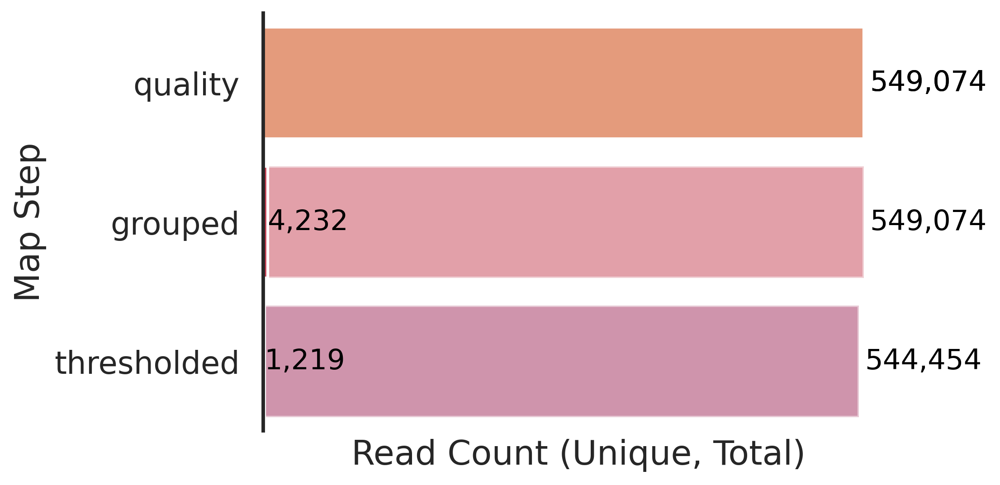

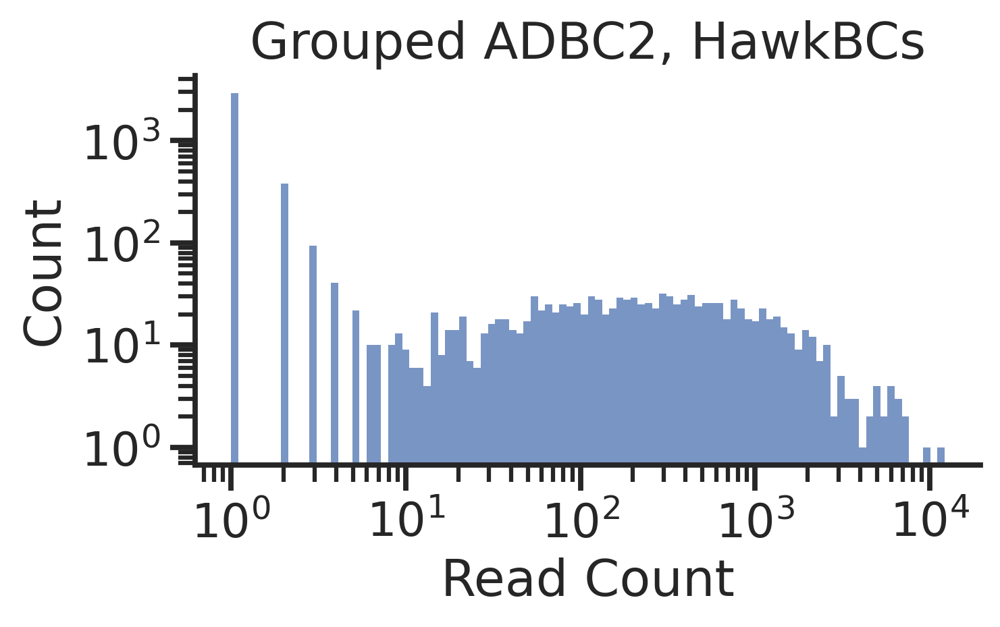

Done in 0.72 seconds.

Thresholding...
Using reads threshold of 15.


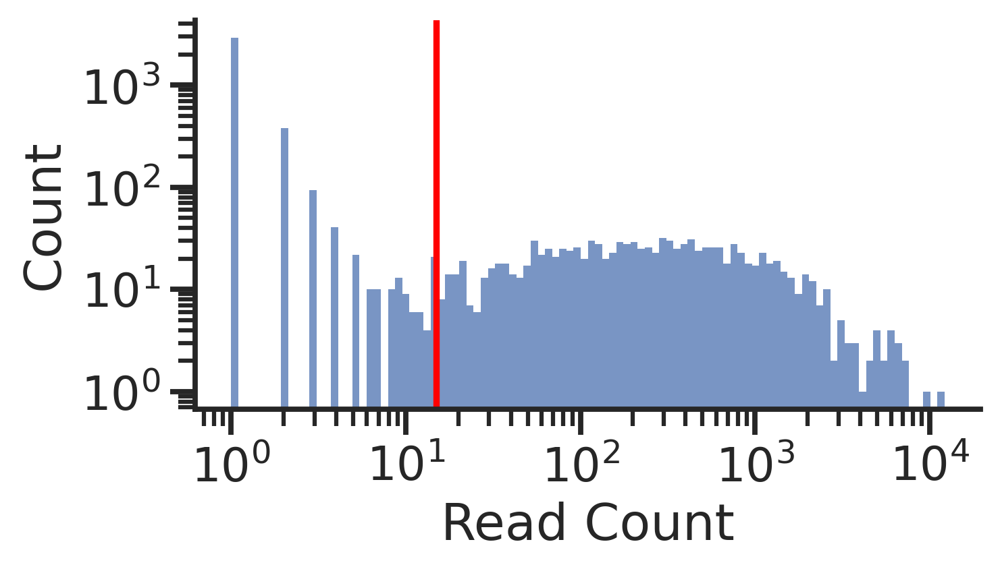

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

a3_RNA_ADBC_S19
Reading 1 FASTQ/TXT file(s)...
Done in 1.61 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.88 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.12 seconds.

Extracting UMIs (12 bases)...
Done in 0.54 seconds.

Done in 1.46 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_
Full prefix for this instance: umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.54 seconds.

Grouping umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_quality...


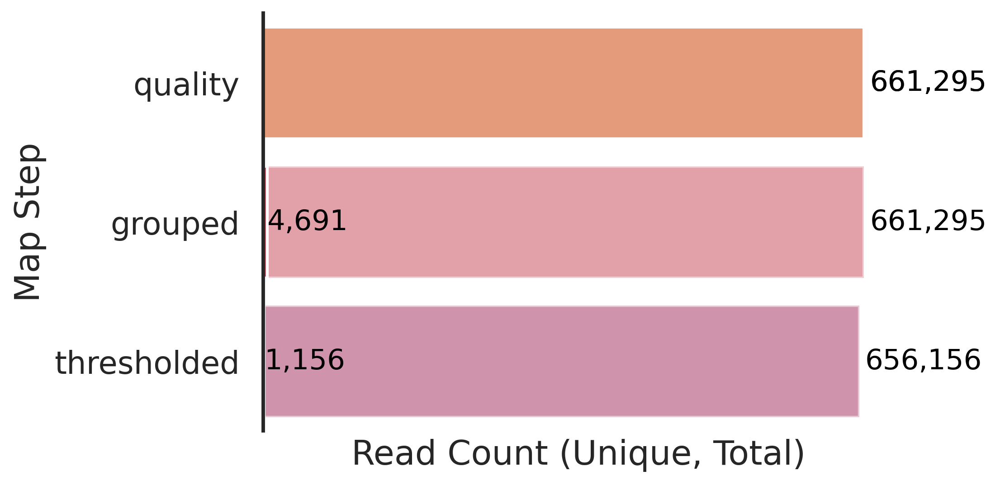

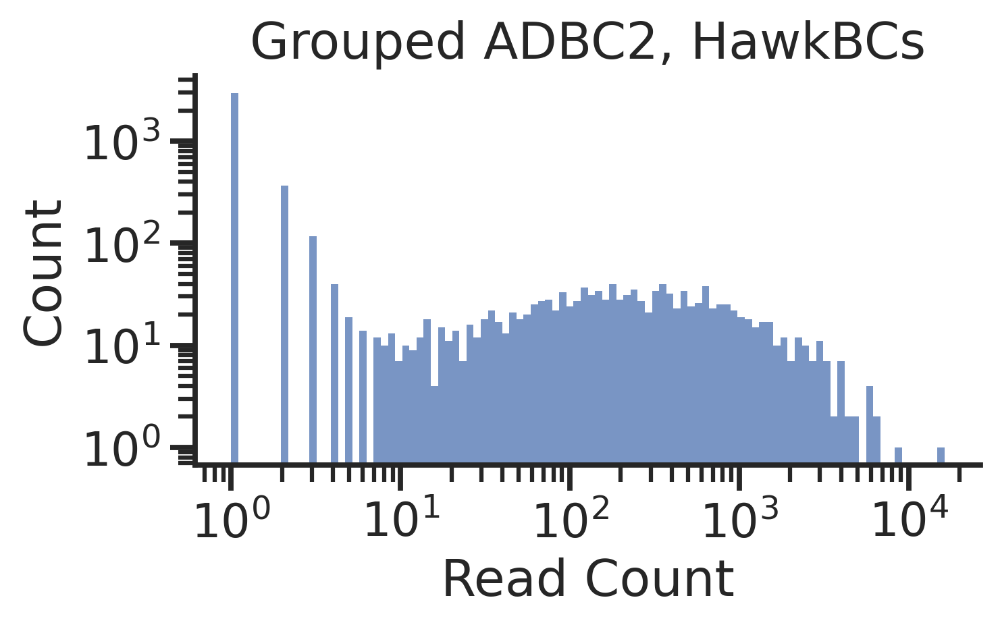

Done in 0.73 seconds.

Thresholding...
Using reads threshold of 15.


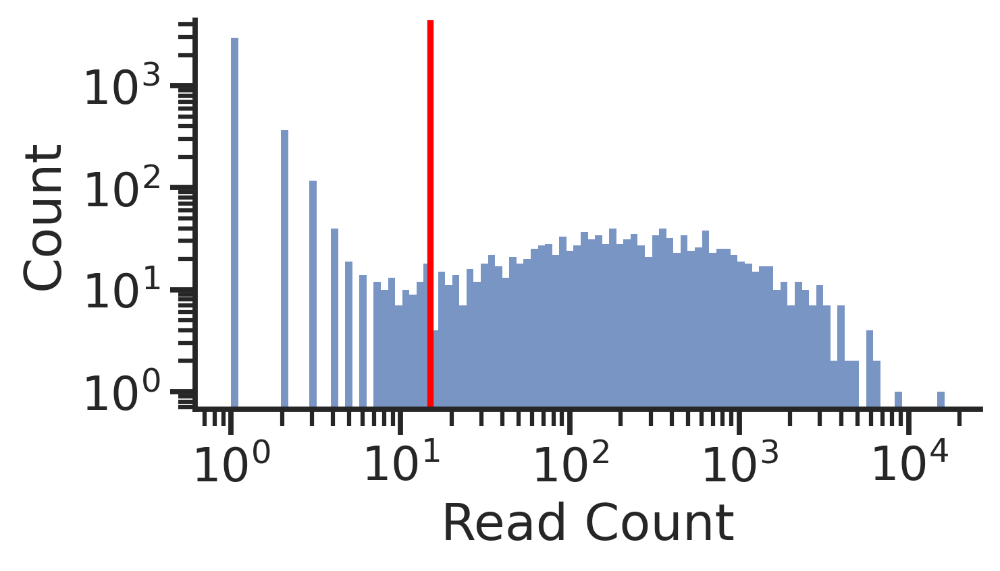

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

a6_RNA_ADBC_S22
Reading 1 FASTQ/TXT file(s)...
Done in 1.49 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.10 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.00 seconds.

Extracting UMIs (12 bases)...
Done in 0.48 seconds.

Done in 1.28 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_
Full prefix for this instance: umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.49 seconds.

Grouping umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_quality...


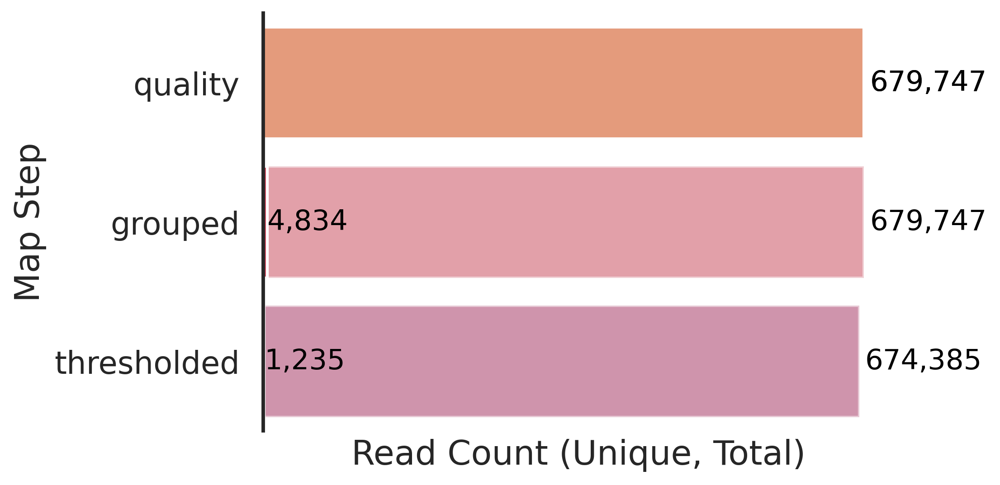

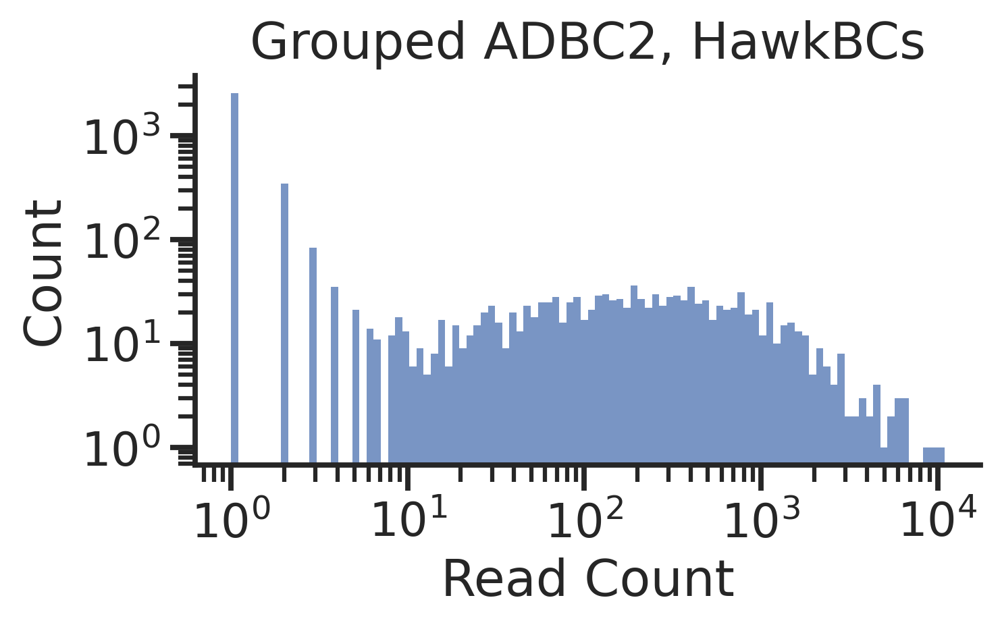

Done in 1.03 seconds.

Thresholding...
Using reads threshold of 15.


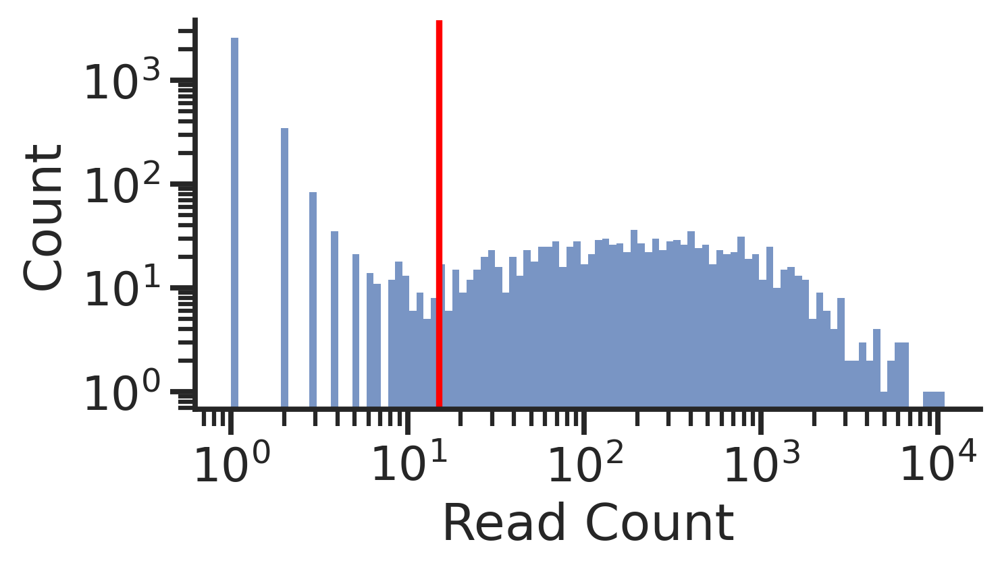

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

a4_RNA_ADBC_S20
Reading 1 FASTQ/TXT file(s)...
Done in 1.65 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.41 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 2.87 seconds.

Extracting UMIs (12 bases)...
Done in 0.50 seconds.

Done in 1.42 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_
Full prefix for this instance: umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.51 seconds.

Grouping umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_quality...


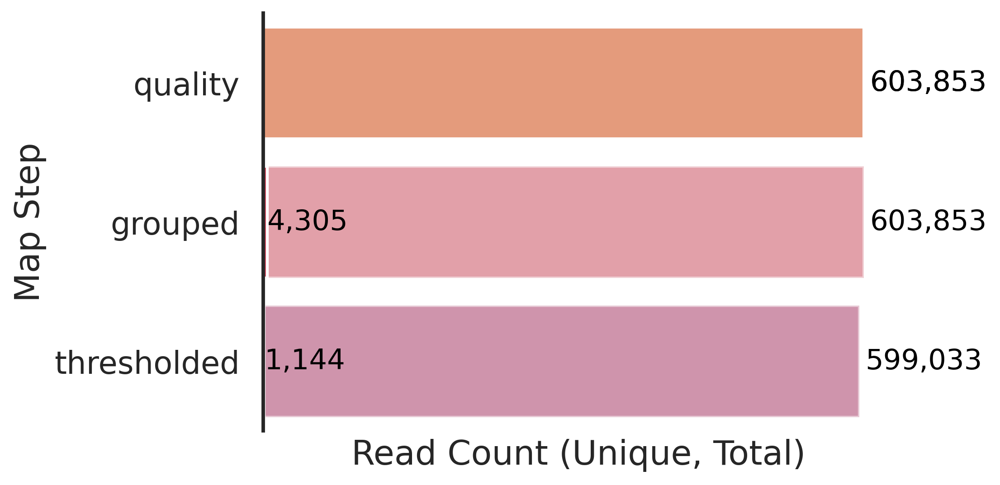

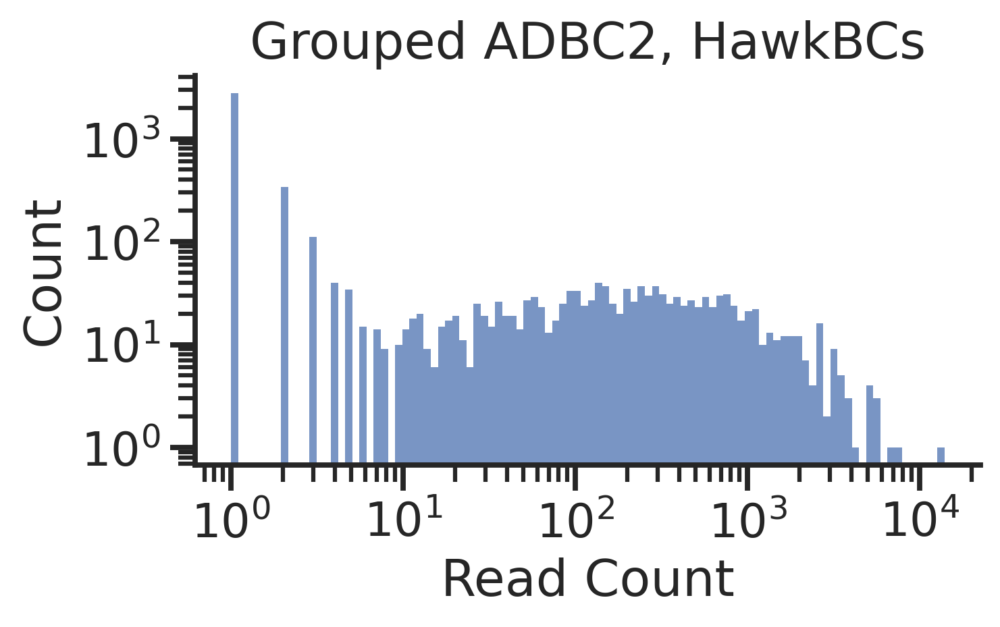

Done in 0.74 seconds.

Thresholding...
Using reads threshold of 15.


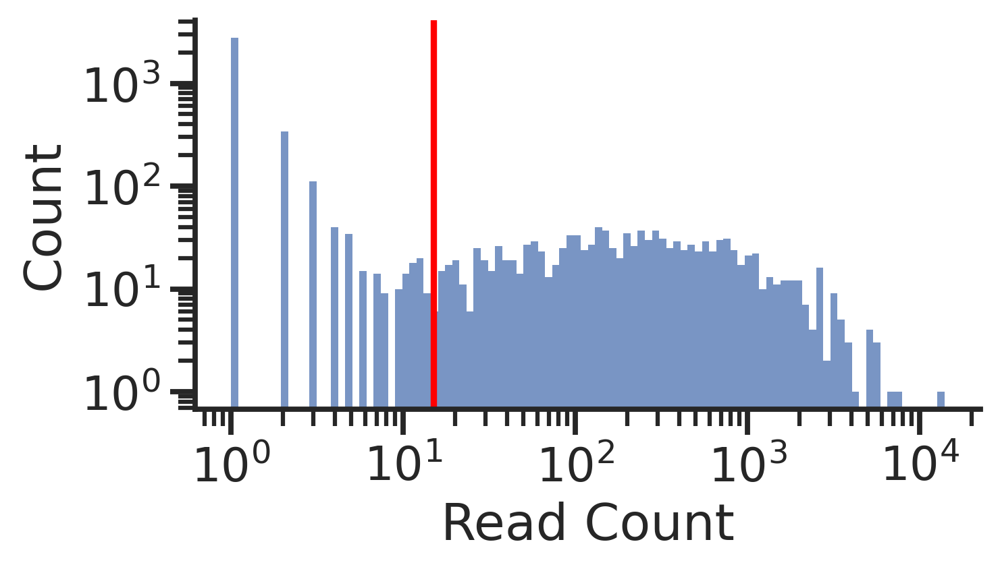

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

a8_RNA_ADBC_S24
Reading 1 FASTQ/TXT file(s)...
Done in 1.65 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.91 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.10 seconds.

Extracting UMIs (12 bases)...
Done in 0.55 seconds.

Done in 1.51 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_
Full prefix for this instance: umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.58 seconds.

Grouping umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_quality...


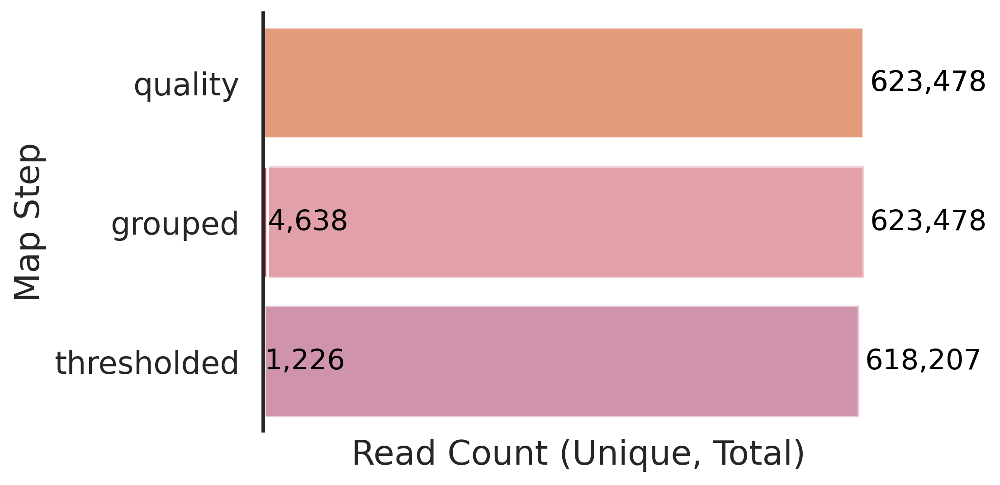

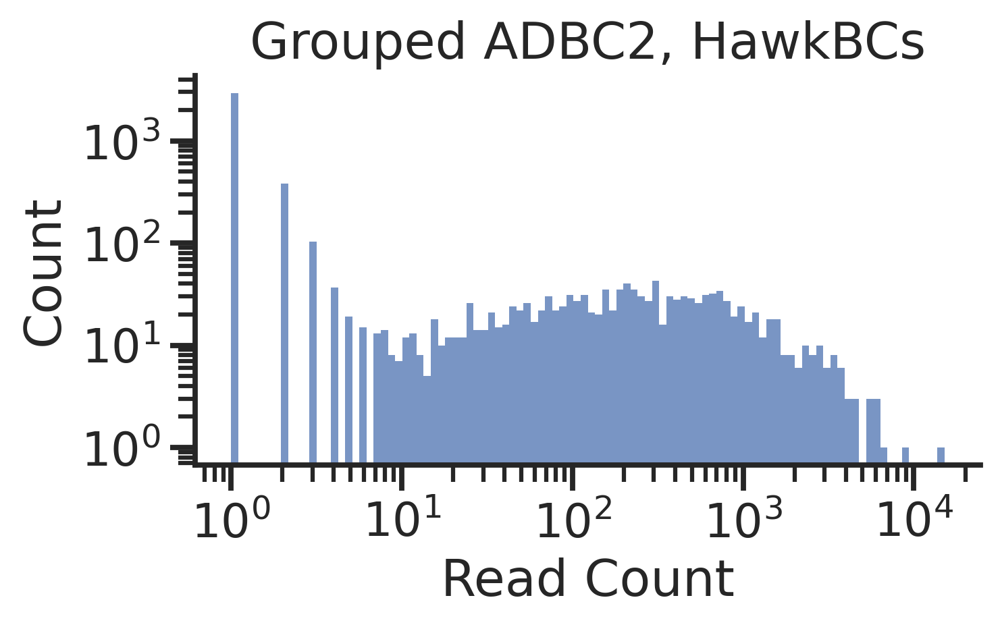

Done in 0.77 seconds.

Thresholding...
Using reads threshold of 15.


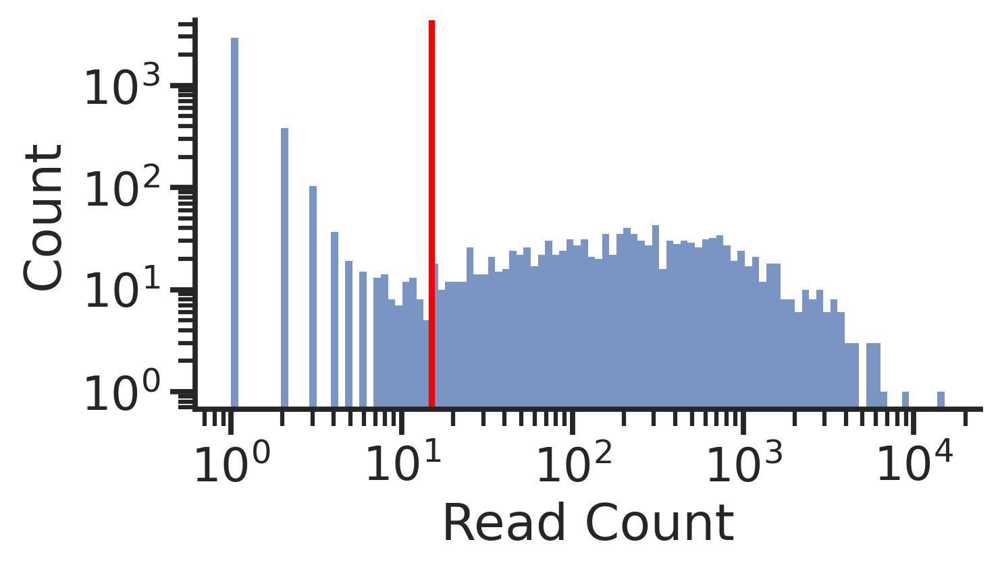

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

a5_RNA_ADBC_S21
Reading 1 FASTQ/TXT file(s)...
Done in 1.75 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.17 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 3.29 seconds.

Extracting UMIs (12 bases)...
Done in 0.56 seconds.

Done in 1.51 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_
Full prefix for this instance: umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.57 seconds.

Grouping umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_quality...


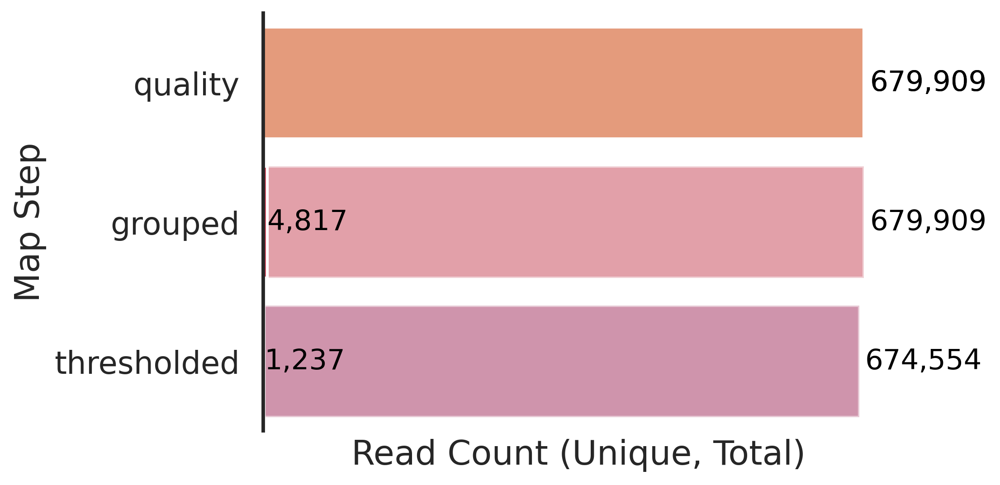

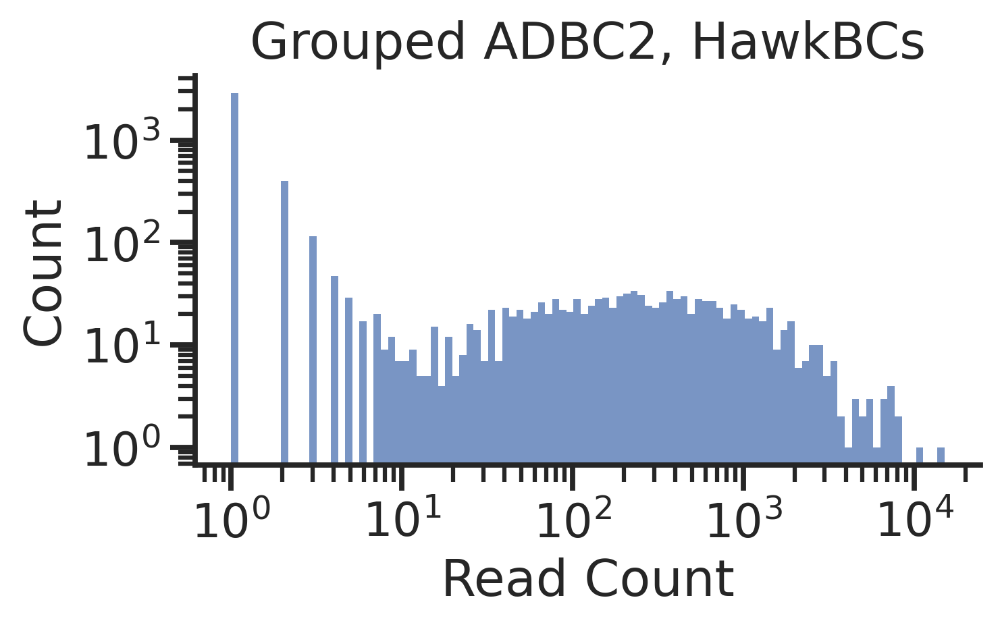

Done in 0.72 seconds.

Thresholding...
Using reads threshold of 15.


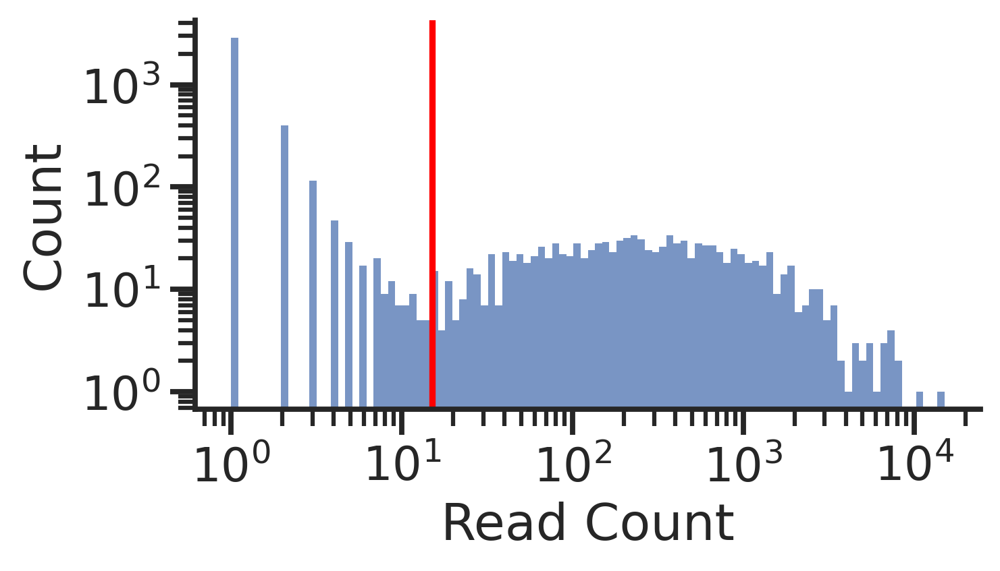

Done in 0.47 seconds.

Done.
Saved loss summary table as 'umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.



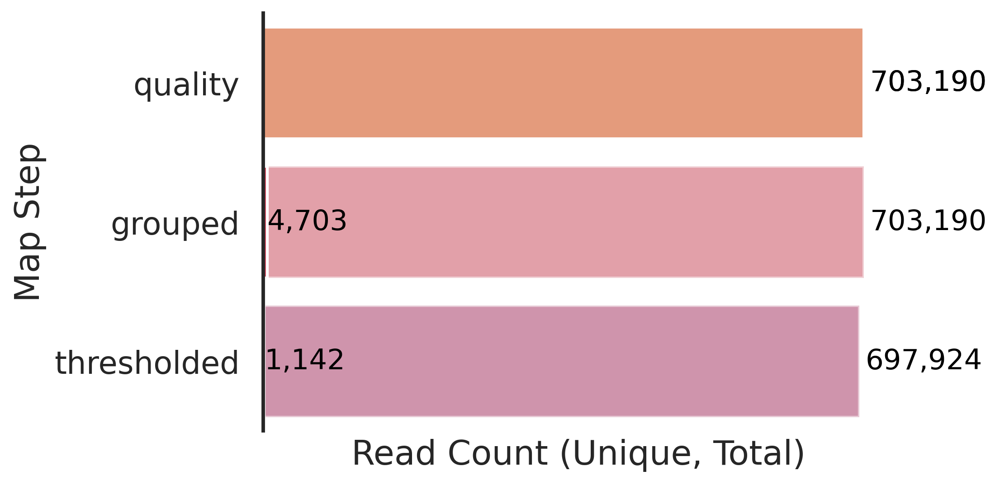

In [35]:
AD_objects = [step1_ADBC2, step1_HawkBCs]

for file_path in AD_seq_files:
    
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    # Extract UMIs and barcodes from reads
    umi_mapper = initial_map.InitialMapper(db_path = db_path_no_ec,
                                       step_name = f"umi_{name_only}", 
                                       seq_file = file_path,
                                       design_file_path = None,
                                       bc_objects = AD_objects,
                                       reverse_complement = True,
                                       umi_length = 12)
    umi_mapper.create_map()

    print("refining")

    key = file_path.split("/")[-1].split(".")[0]
    
    # Only keep barcodes of correct length, then error correct
    refiner_no_ec = map_refiner.MapRefiner(db_path = db_path_no_ec,
                                        bc_objects=AD_objects,
                                        column_pairs = [],
                                        reads_threshold = 15,
                                        map_order = ['quality', 'grouped', 'thresholded'],
                                        step_name=f"umi_{name_only}", 
                                        descriptor = "",
                                    should_check_exists = False,
                                    design_check = False)
    refiner_no_ec.refine_map_from_db()
    refiner_no_ec.plot_loss()



r2_RNA_RTBC_S26
Reading 1 FASTQ/TXT file(s)...
Done in 1.73 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.66 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 1.96 seconds.

Extracting UMIs (12 bases)...
Done in 0.74 seconds.

Done in 1.57 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r2_RNA_RTBC_S26_RTBC_
Full prefix for this instance: umi_r2_RNA_RTBC_S26_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r2_RNA_RTBC_S26_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.54 seconds.

Grouping umi_r2_RNA_RTBC_S26_RTBC_quality...


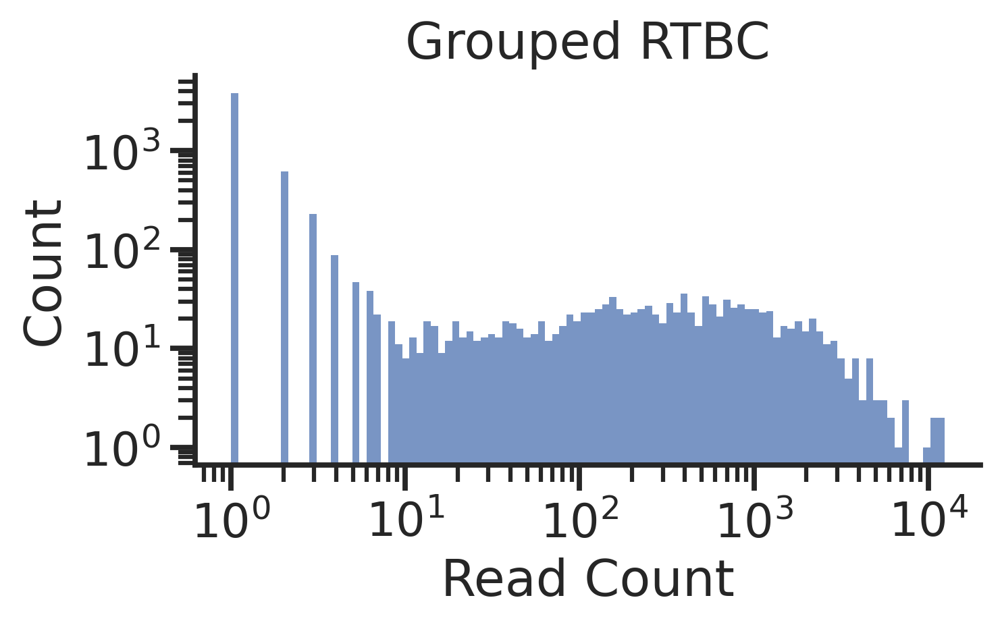

Done in 0.58 seconds.

Thresholding...
Using reads threshold of 30.


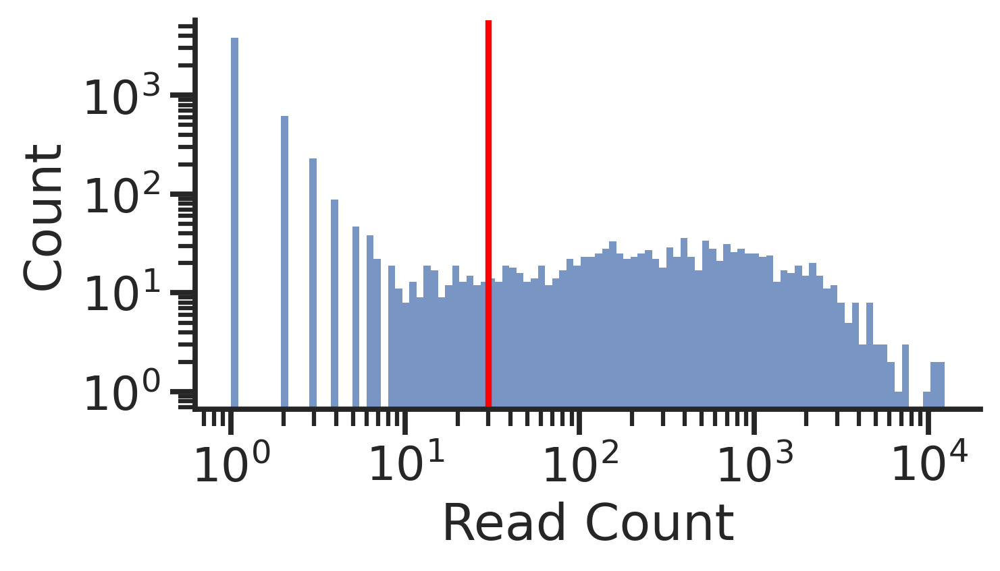

Done in 0.89 seconds.

Done.
Saved loss summary table as 'umi_r2_RNA_RTBC_S26_RTBC_loss_summary'
Done in 0.01 seconds.

r8_RNA_RTBC_S32
Reading 1 FASTQ/TXT file(s)...
Done in 2.00 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.64 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 1.90 seconds.

Extracting UMIs (12 bases)...
Done in 0.81 seconds.

Done in 1.74 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r8_RNA_RTBC_S32_RTBC_
Full prefix for this instance: umi_r8_RNA_RTBC_S32_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r8_RNA_RTBC_S32_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.63 seconds.

Grouping umi_r8_RNA_RTBC_S32_RTBC_quality...


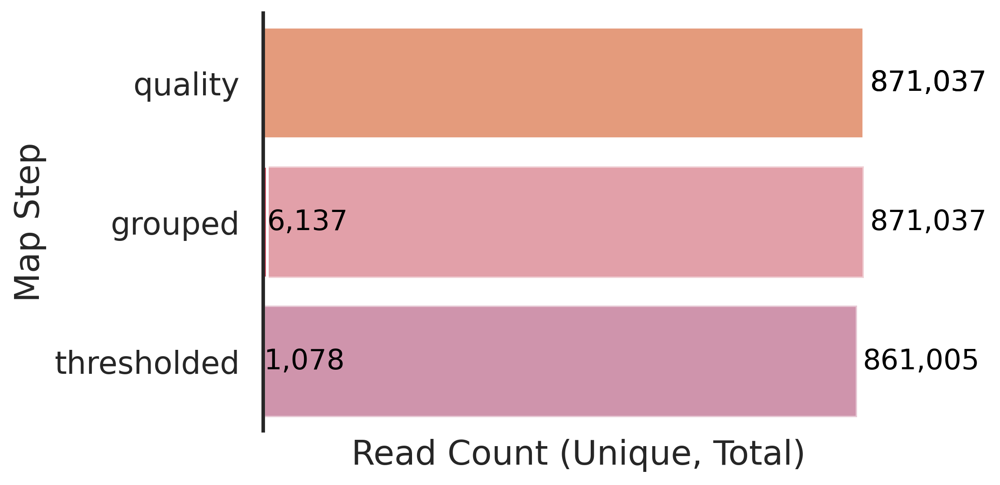

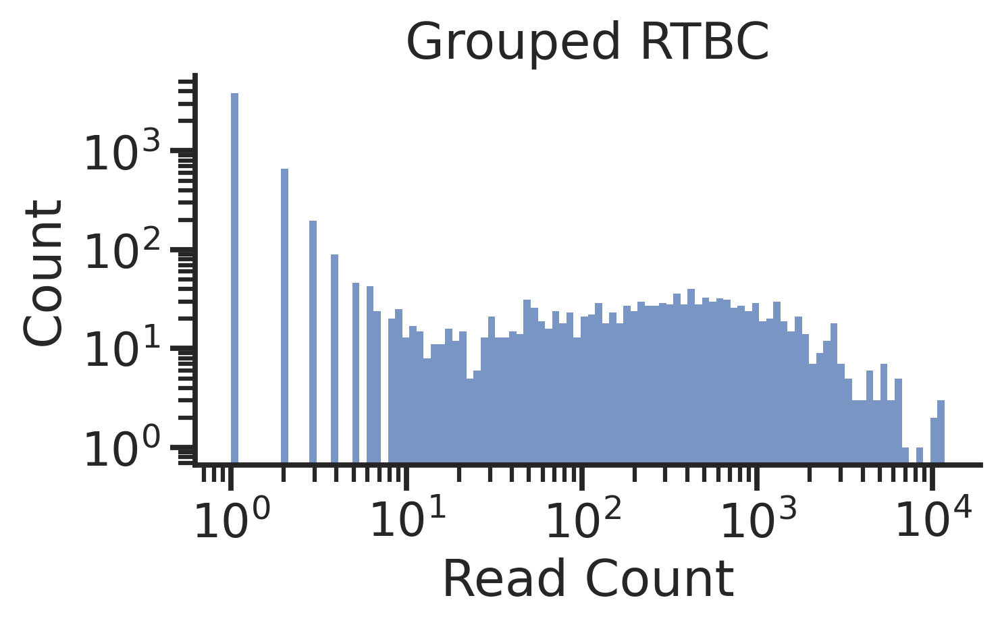

Done in 0.75 seconds.

Thresholding...
Using reads threshold of 30.


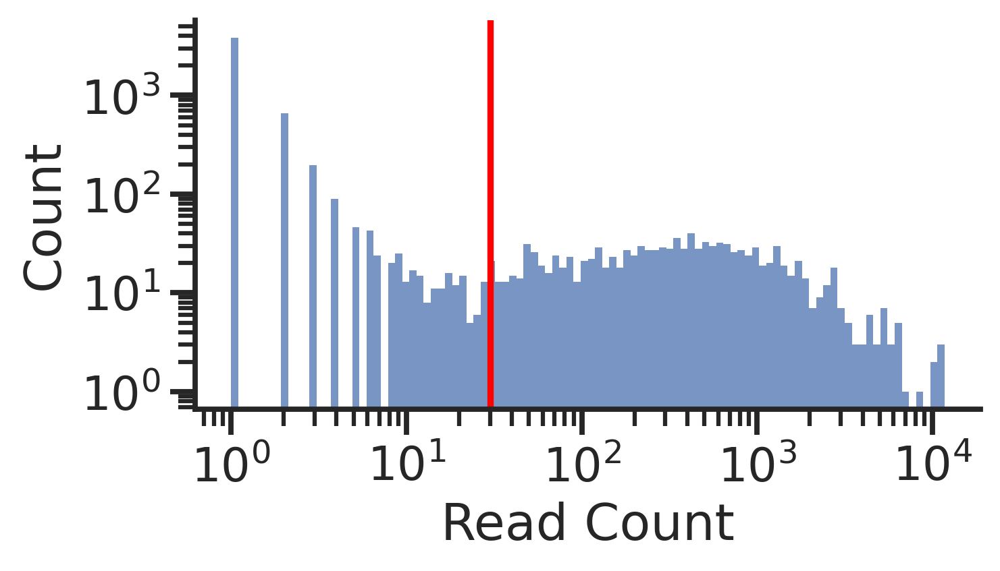

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_r8_RNA_RTBC_S32_RTBC_loss_summary'
Done in 0.01 seconds.

r7_RNA_RTBC_S31
Reading 1 FASTQ/TXT file(s)...
Done in 1.30 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.46 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 1.41 seconds.

Extracting UMIs (12 bases)...
Done in 0.48 seconds.

Done in 1.17 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r7_RNA_RTBC_S31_RTBC_
Full prefix for this instance: umi_r7_RNA_RTBC_S31_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r7_RNA_RTBC_S31_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.41 seconds.

Grouping umi_r7_RNA_RTBC_S31_RTBC_quality...


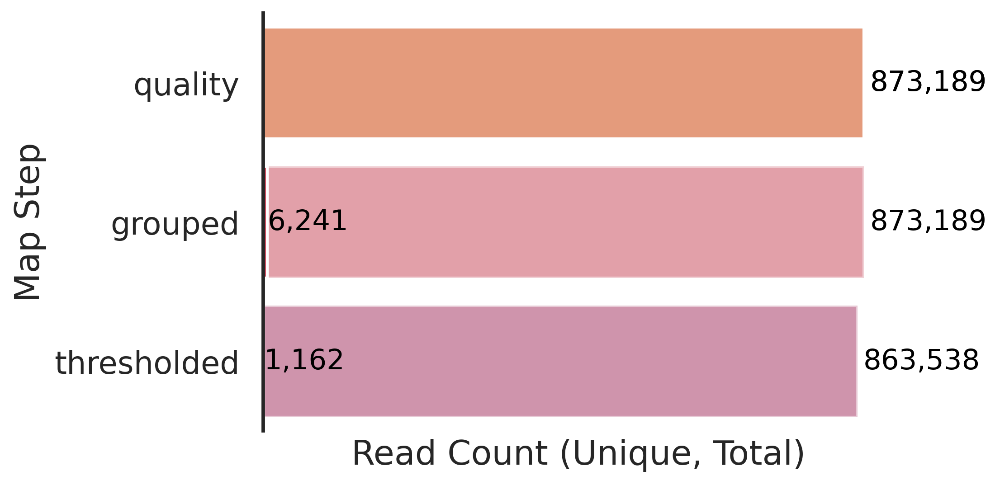

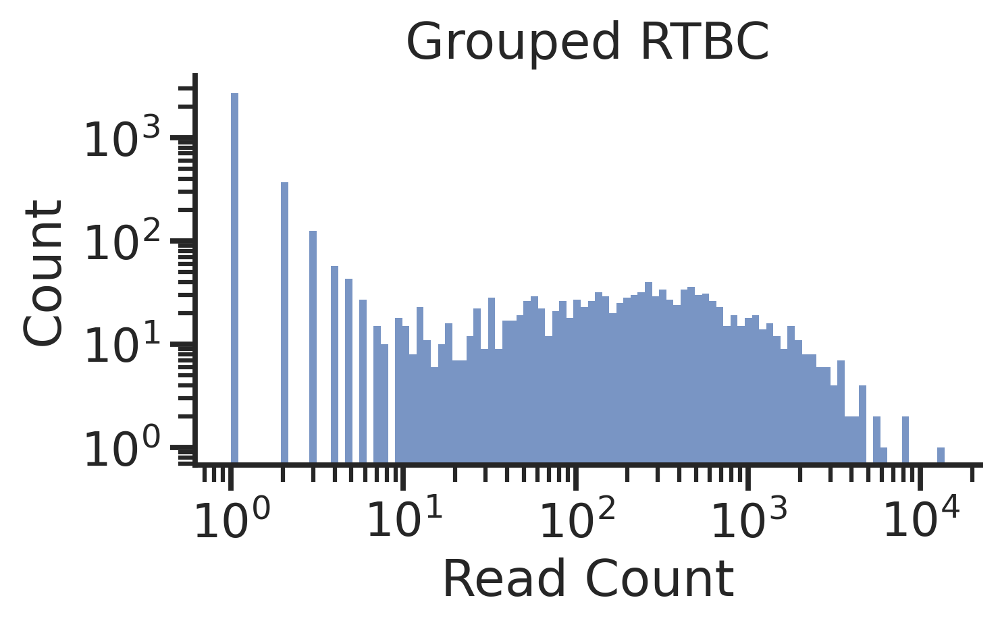

Done in 0.75 seconds.

Thresholding...
Using reads threshold of 30.


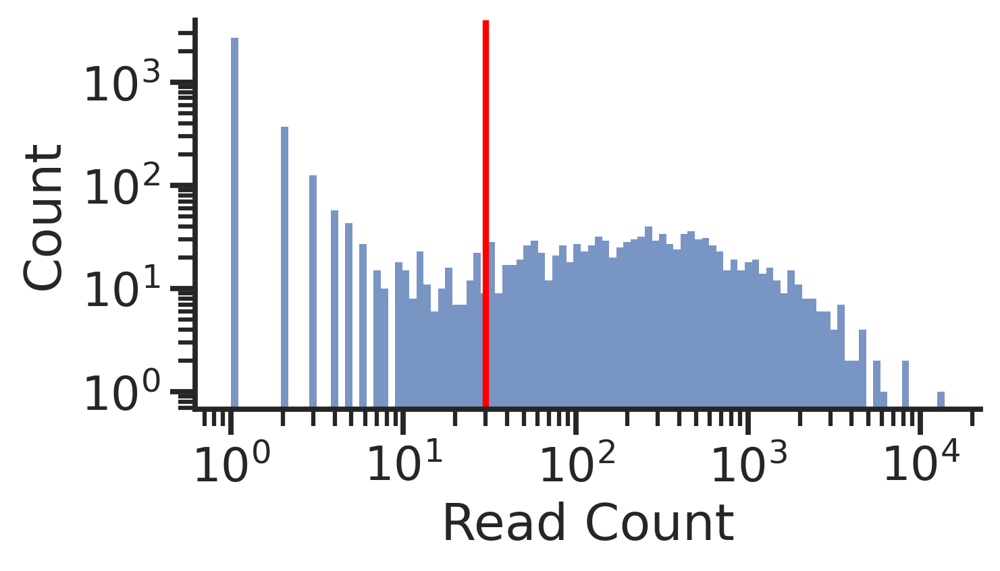

Done in 0.55 seconds.

Done.
Saved loss summary table as 'umi_r7_RNA_RTBC_S31_RTBC_loss_summary'
Done in 0.01 seconds.

r1_RNA_RTBC_S25
Reading 1 FASTQ/TXT file(s)...
Done in 1.86 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 8.17 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 2.01 seconds.

Extracting UMIs (12 bases)...
Done in 0.84 seconds.

Done in 1.64 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r1_RNA_RTBC_S25_RTBC_
Full prefix for this instance: umi_r1_RNA_RTBC_S25_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r1_RNA_RTBC_S25_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.73 seconds.

Grouping umi_r1_RNA_RTBC_S25_RTBC_quality...


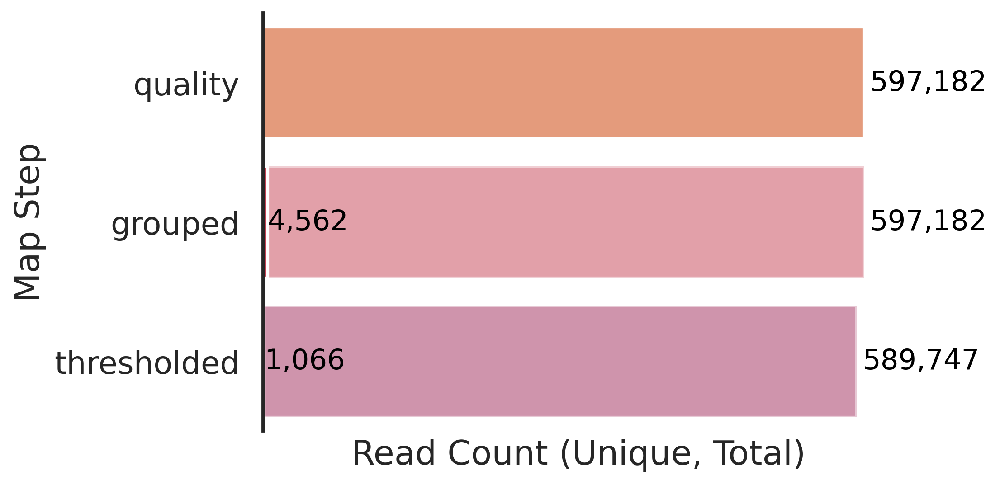

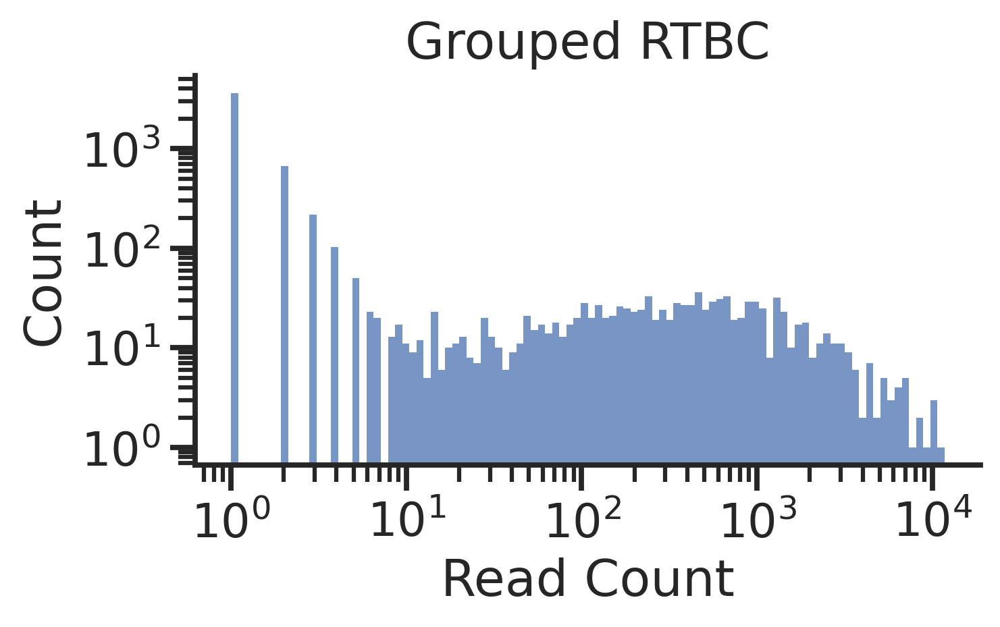

Done in 0.75 seconds.

Thresholding...
Using reads threshold of 30.


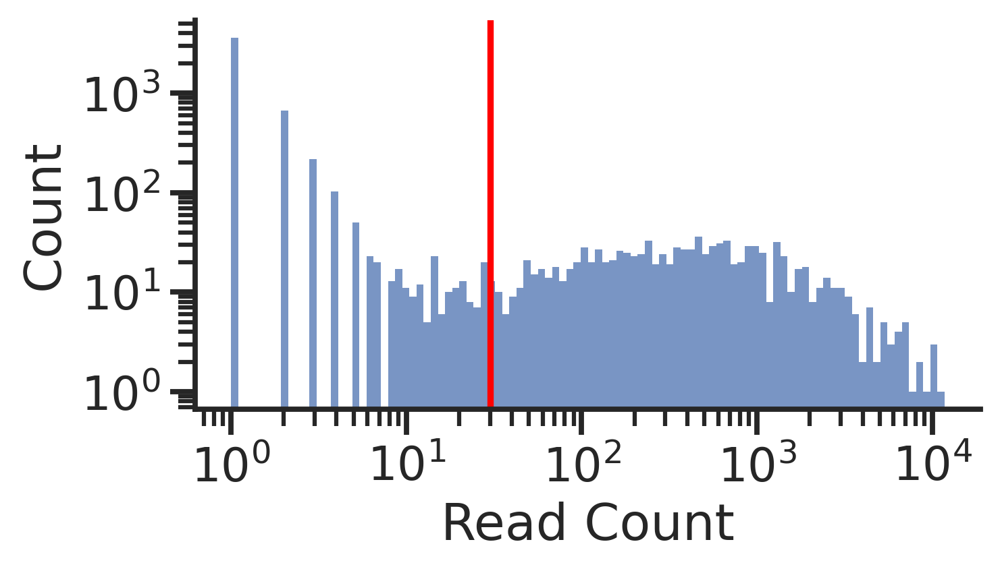

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_r1_RNA_RTBC_S25_RTBC_loss_summary'
Done in 0.02 seconds.

r6_RNA_RTBC_S30
Reading 1 FASTQ/TXT file(s)...
Done in 1.83 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 8.19 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 2.14 seconds.

Extracting UMIs (12 bases)...
Done in 0.80 seconds.

Done in 1.74 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r6_RNA_RTBC_S30_RTBC_
Full prefix for this instance: umi_r6_RNA_RTBC_S30_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r6_RNA_RTBC_S30_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.62 seconds.

Grouping umi_r6_RNA_RTBC_S30_RTBC_quality...


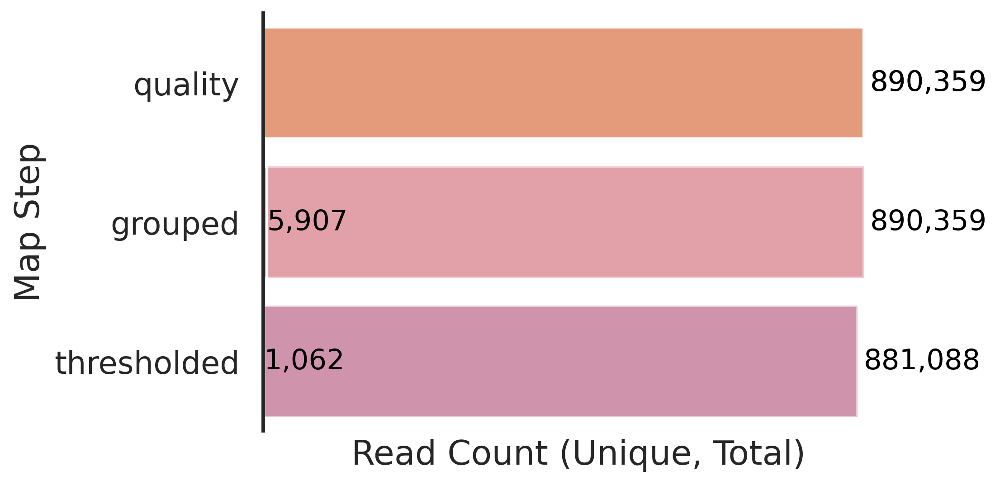

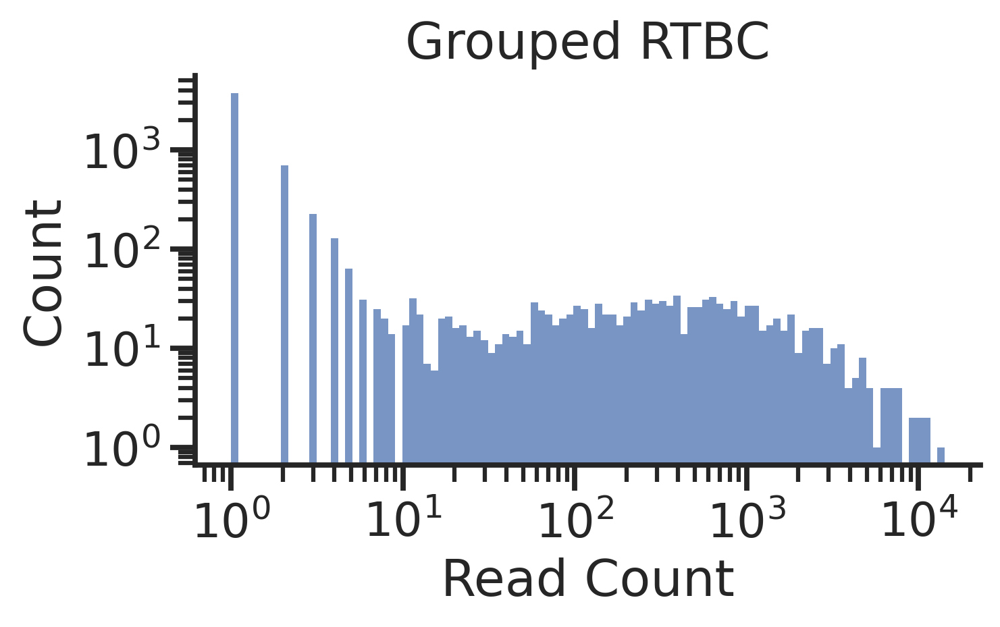

Done in 0.75 seconds.

Thresholding...
Using reads threshold of 30.


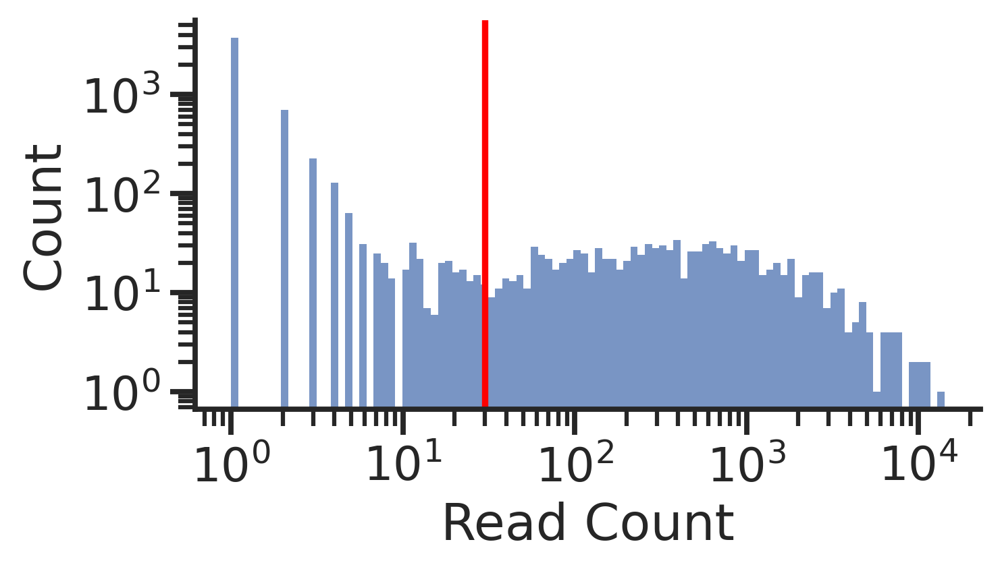

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_r6_RNA_RTBC_S30_RTBC_loss_summary'
Done in 0.01 seconds.

r3_RNA_RTBC_S27
Reading 1 FASTQ/TXT file(s)...
Done in 2.12 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 8.29 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 2.02 seconds.

Extracting UMIs (12 bases)...
Done in 0.95 seconds.

Done in 1.80 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r3_RNA_RTBC_S27_RTBC_
Full prefix for this instance: umi_r3_RNA_RTBC_S27_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r3_RNA_RTBC_S27_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.56 seconds.

Grouping umi_r3_RNA_RTBC_S27_RTBC_quality...


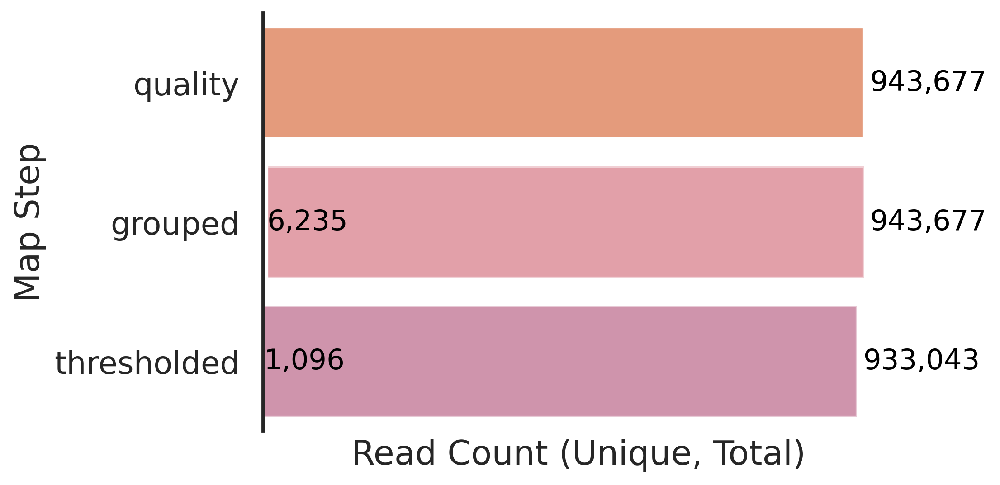

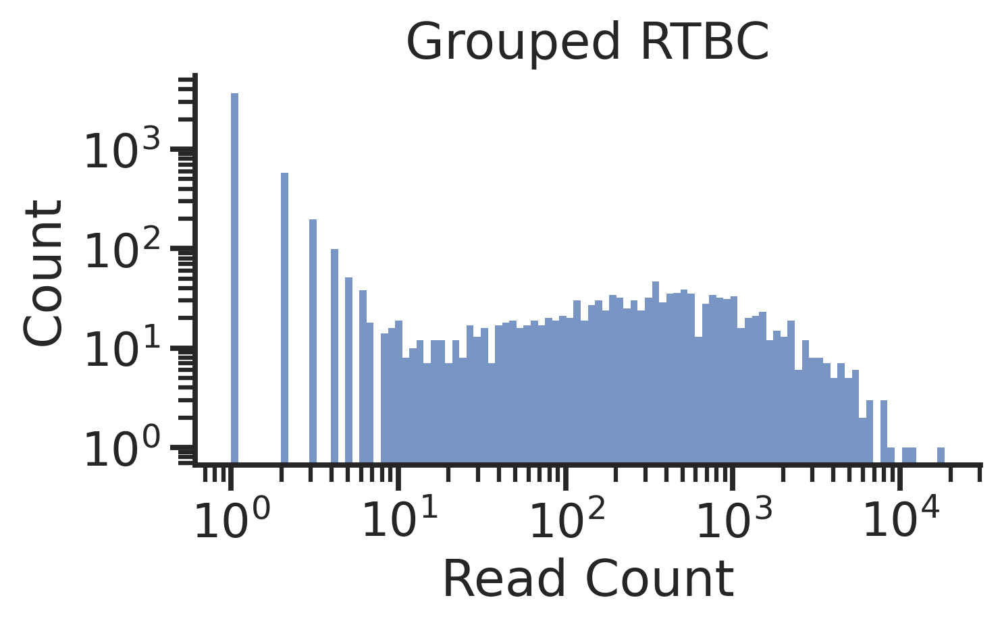

Done in 0.78 seconds.

Thresholding...
Using reads threshold of 30.


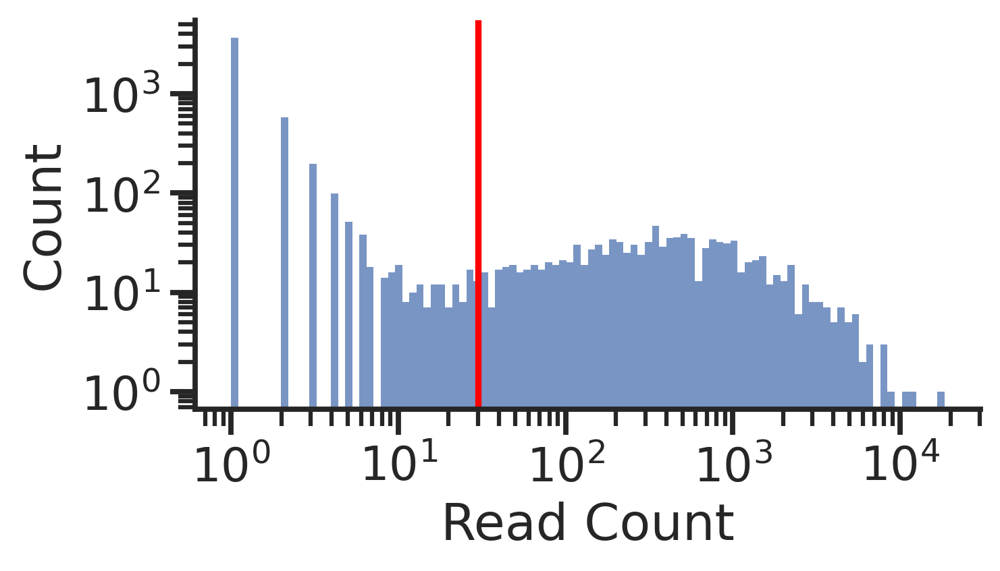

Done in 0.99 seconds.

Done.
Saved loss summary table as 'umi_r3_RNA_RTBC_S27_RTBC_loss_summary'
Done in 0.01 seconds.

r5_RNA_RTBC_S29
Reading 1 FASTQ/TXT file(s)...
Done in 1.17 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.07 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 1.39 seconds.

Extracting UMIs (12 bases)...
Done in 0.52 seconds.

Done in 1.17 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r5_RNA_RTBC_S29_RTBC_
Full prefix for this instance: umi_r5_RNA_RTBC_S29_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r5_RNA_RTBC_S29_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.42 seconds.

Grouping umi_r5_RNA_RTBC_S29_RTBC_quality...


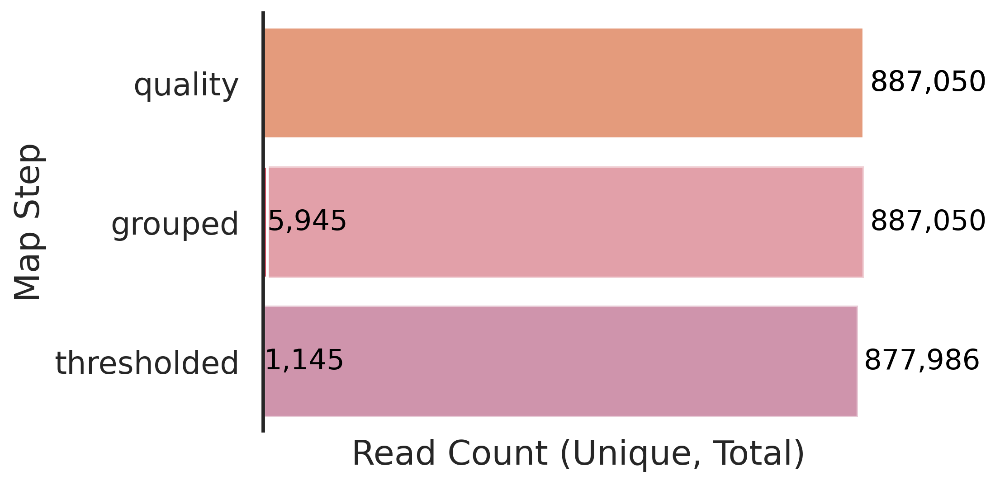

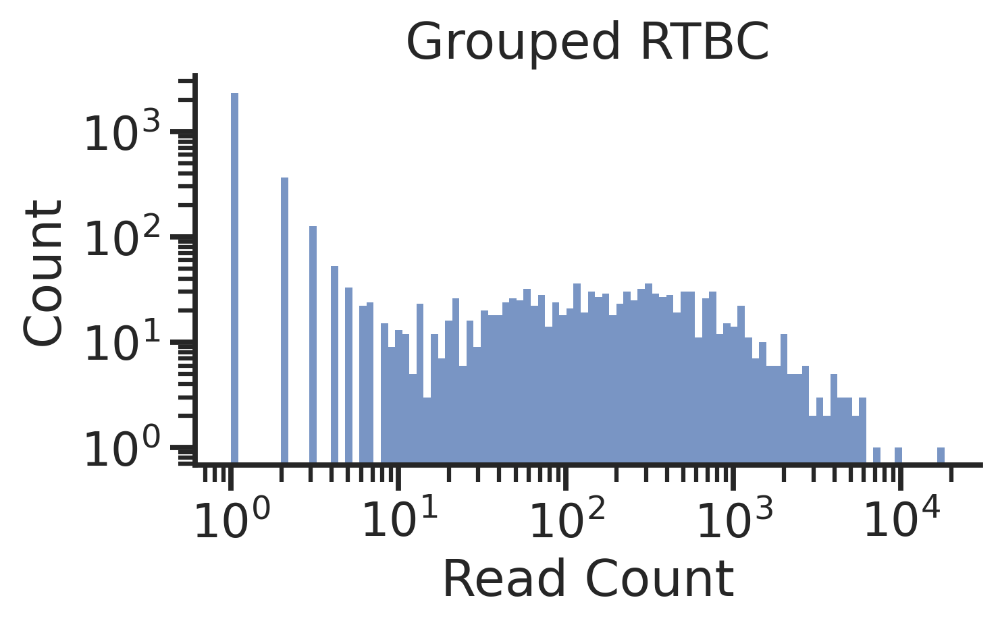

Done in 0.72 seconds.

Thresholding...
Using reads threshold of 30.


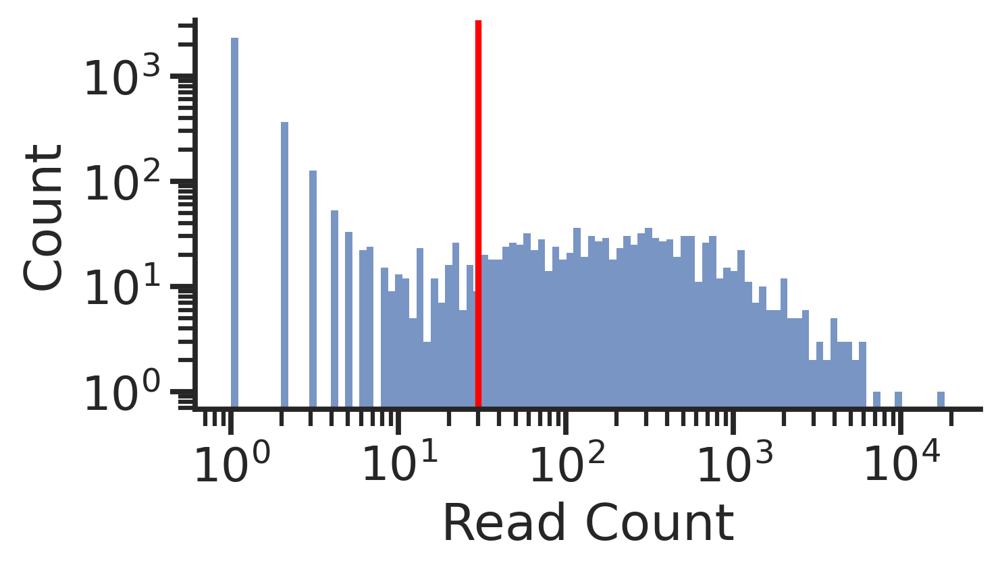

Done in 0.48 seconds.

Done.
Saved loss summary table as 'umi_r5_RNA_RTBC_S29_RTBC_loss_summary'
Done in 0.01 seconds.

r4_RNA_RTBC_S28
Reading 1 FASTQ/TXT file(s)...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.06 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 14.20 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.26 seconds.

Extracting UMIs (12 bases)...
Done in 1.17 seconds.



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 2.83 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_r4_RNA_RTBC_S28_RTBC_
Full prefix for this instance: umi_r4_RNA_RTBC_S28_RTBC_

Using the following step order:
1. initial
2. quality
3. grouped
4. thresholded


Filtering to high-quality reads...
Created table: umi_r4_RNA_RTBC_S28_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.96 seconds.

Grouping umi_r4_RNA_RTBC_S28_RTBC_quality...


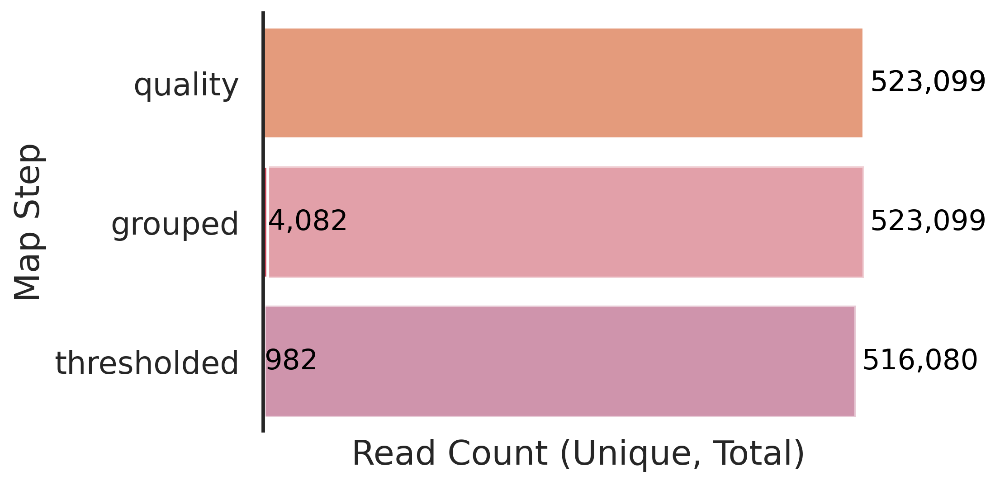

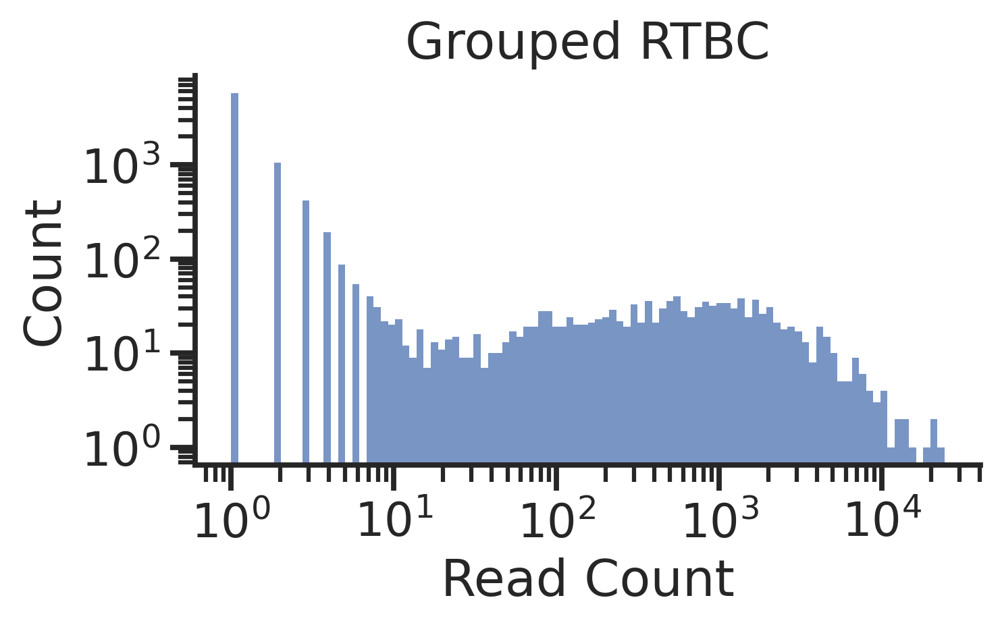

Done in 0.76 seconds.

Thresholding...
Using reads threshold of 30.


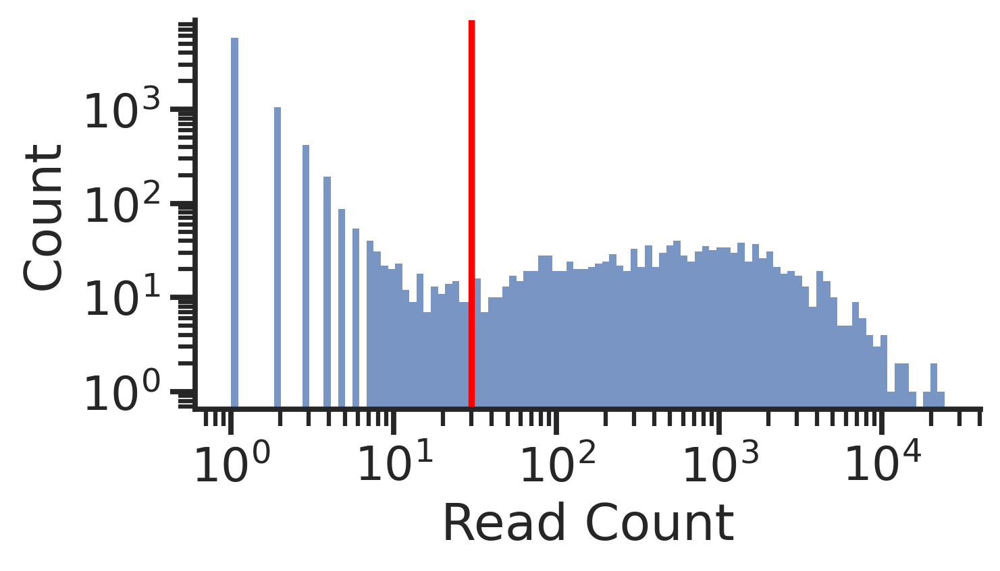

Done in 0.53 seconds.

Done.
Saved loss summary table as 'umi_r4_RNA_RTBC_S28_RTBC_loss_summary'
Done in 0.01 seconds.



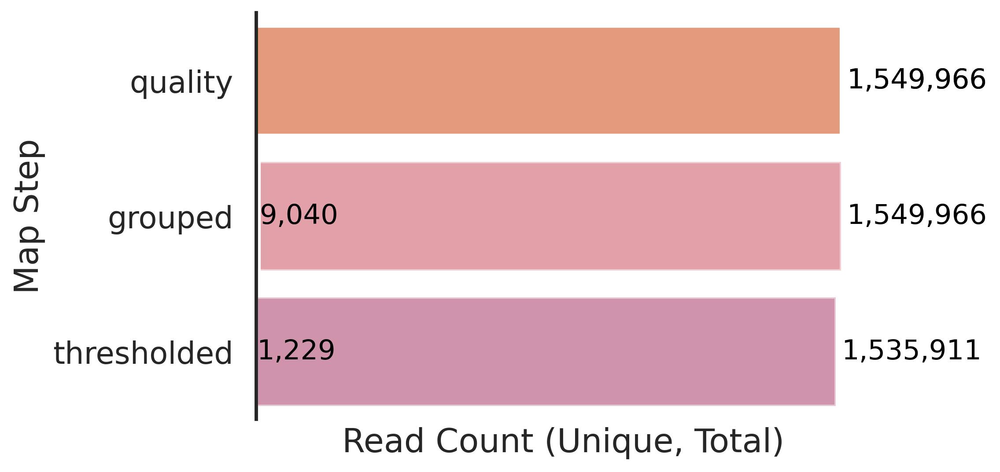

In [36]:
for file_path in RT_seq_files:
    
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    # Extract UMIs and barcodes from reads
    umi_mapper = initial_map.InitialMapper(db_path = db_path_no_ec,
                                       step_name = f"umi_{name_only}", 
                                       seq_file = file_path,
                                       design_file_path = None,
                                       bc_objects = RTBC_objects,
                                       reverse_complement = True,
                                       umi_length = 12)
    umi_mapper.create_map()

    print("refining")
    
    # Only keep barcodes of correct length, then error correct
    refiner_no_ec = map_refiner.MapRefiner(db_path = db_path_no_ec,
                                        bc_objects=RTBC_objects,
                                        column_pairs = [],
                                        reads_threshold = 30,
                                        map_order = ['quality', 'grouped', 'thresholded'],
                                        step_name=f"umi_{name_only}", 
                                        descriptor = "",
                                    should_check_exists = False,
                                    design_check = False)
    refiner_no_ec.refine_map_from_db()
    refiner_no_ec.plot_loss()


umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_
umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_
umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_
umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_
umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_
umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_
umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_
umi_r1_RNA_RTBC_S25_RTBC_
umi_r2_RNA_RTBC_S26_RTBC_
umi_r3_RNA_RTBC_S27_RTBC_
umi_r4_RNA_RTBC_S28_RTBC_
umi_r5_RNA_RTBC_S29_RTBC_
umi_r6_RNA_RTBC_S30_RTBC_
umi_r7_RNA_RTBC_S31_RTBC_
umi_r8_RNA_RTBC_S32_RTBC_


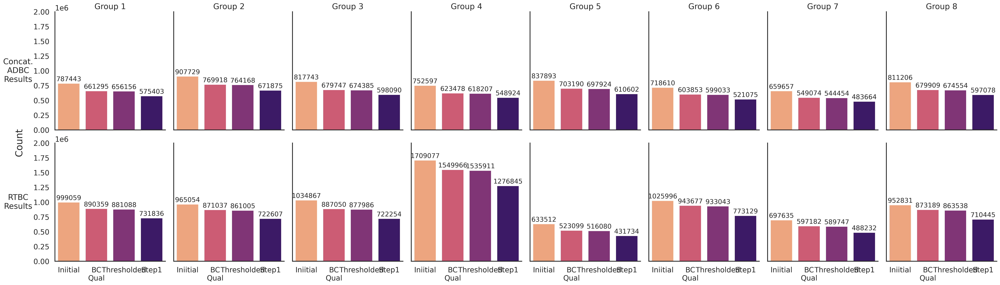

In [42]:
step1_map = pd.read_csv(step1_csv, index_col = 0)

palette = sns.color_palette('magma_r', n_colors = 4)

fig, axes = plt.subplots(2, 8, figsize=(32,9), dpi=300, sharey=True, sharex = True)
axes = axes.flatten()  # flatten to index easily 0..15

# First row: AD (ADBC/HawkBCs)
for i in np.arange(1, 9):
    file_prefix = f'umi_a{i}_RNA_ADBC_S{16 + i}_ADBC2_HawkBCs_'
    print(file_prefix)
    
    initial_df = refiner_no_ec.get_map_df(file_prefix + "initial")
    quality_df = refiner_no_ec.get_map_df(file_prefix + "quality")
    thresholded_df = refiner_no_ec.get_map_df(file_prefix + "thresholded")
    
    init_count = len(initial_df)
    qual_count = len(quality_df)
    thresholded_count = sum(thresholded_df["count"])
    step1_df = thresholded_df[(thresholded_df["ADBC2"].isin(step1_map["ADBC2"])) & (thresholded_df["HawkBCs"].isin(step1_map["HawkBCs"]))]
    step1_count = sum(step1_df["count"])
    
    plot_counts = pd.DataFrame({
        "Category": ["Iniitial", "BC\nQual", "Thresholded", "Step1"],
        "Count": [init_count, qual_count, thresholded_count, step1_count]
    })

    ax = axes[i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=palette)
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    ax.set_title("Group " + str(file_prefix[:6][-1]), fontsize='medium')
    ax.set_xlabel("")
    ax.set_ylabel("")

# Second row: RPTR (RTBC)
for i in np.arange(1, 9):
    file_prefix = f'umi_r{i}_RNA_RTBC_S{24 + i}_RTBC_'
    print(file_prefix)
    
    initial_df = refiner_no_ec.get_map_df(file_prefix + "initial")
    quality_df = refiner_no_ec.get_map_df(file_prefix + "quality")
    thresholded_df = refiner_no_ec.get_map_df(file_prefix + "thresholded")
    
    init_count = len(initial_df)
    qual_count = len(quality_df)
    thresholded_count = sum(thresholded_df["count"])
    step1_df = thresholded_df[(thresholded_df["RTBC"].isin(step1_map["RTBC"]))]
    step1_count = sum(step1_df["count"])
    
    plot_counts = pd.DataFrame({
        "Category": ["Iniitial", "BC\nQual", "Thresholded", "Step1"],
        "Count": [init_count, qual_count, thresholded_count, step1_count]
    })

    ax = axes[8 + i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=palette)
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    ax.set_xlabel("")
    ax.set_ylabel("")

axes[0].set_ylabel("Concat.\nADBC\nResults", rotation = 0, labelpad = 35, va = 'center')
axes[8].set_ylabel("RTBC\nResults", rotation = 0, labelpad = 35, va = 'center')

axes[0].set_ylim(0, 2000000)
fig.supylabel("Count")
sns.despine()
plt.tight_layout(pad = 0.25)
# fig.suptitle("BC Quality Loss", y = 1.1)
# plt.savefig(os.path.join(output_path, f"bc_quality_loss.png"))
# plt.show()